In [1]:
cd /home/yuchen/pulse2percept

/home/yuchen/pulse2percept


In [2]:
from pulse2percept.models import BiphasicAxonMapModel, AxonMapModel
from pulse2percept.model_selection import ParticleSwarmOptimizer
import shapes
import pandas as pd
import numpy as np
import pulse2percept
import matplotlib.pyplot as plt
from pulse2percept.stimuli import Stimulus
from pulse2percept.viz import plot_argus_simulated_phosphenes
from pulse2percept.viz import plot_argus_phosphenes
from pulse2percept.implants import ArgusII
from pulse2percept.utils import center_image, trim_image, scale_image
from skimage import measure
from skimage.transform import resize
from pulse2percept.viz import plot_argus_phosphenes
from pulse2percept.implants import ArgusII

Axon

In [3]:
df = pd.read_csv('/home/yuchen/shapes/estimator05xystep/axon.csv')
df = df[(df['subject'] == 's2') & ~df['test_orientation'].isna()]
df = df.sort_values(df.columns[0]).reset_index(drop=True)
df

,electrode,rho,axlambda,train_combined,train_area,train_MSE_major_axis_length,train_MSE_minor_axis_length,test_combined,test_M00,test_M02,...,test_M22,test_area,test_eccentricity,test_major_axis_length,test_minor_axis_length,test_orientation,train_size,test_size,filename,subject
0,A1,162.797723,519.825241,3.449556,1.144632,1.278803,1.026121,1.005603e+04,1.014078,31.743134,...,36.233509,1.010577,9.359511e+03,249.640682,258.366299,24.797375,107,3,Axon_s2_A1.pickle,s2
1,A10,147.314502,658.172940,3.577132,1.154698,1.400365,1.022069,3.414340e+02,8.989147,53.067368,...,1.015594,8.664094,4.430276e+00,225.934077,1.487328,28.436686,107,3,Axon_s2_A10.pickle,s2
2,A2,152.228902,640.545078,3.602581,1.144869,1.421897,1.035815,4.748162e+01,1.002985,1.301679,...,2.286354,1.002985,2.346070e+00,18.871339,1.028665,13.628147,108,2,Axon_s2_A2.pickle,s2
3,A4,151.731792,588.457795,3.594521,1.140455,1.428383,1.025682,2.124297e+03,5.759398,3.024176,...,2.454506,5.759398,8.697871e+02,24.866629,108.221286,601.323883,107,3,Axon_s2_A4.pickle,s2
4,A6,153.731336,567.207942,3.582082,1.124235,1.430844,1.027004,1.884291e+02,1.474642,4.820861,...,3.798012,1.002140,6.561727e+01,4.301470,10.537992,5.823244,108,2,Axon_s2_A6.pickle,s2
5,A8,158.298709,600.940771,3.577649,1.151908,1.406116,1.019625,5.675545e+01,1.854756,1.876741,...,1.993244,2.027956,9.606221e+00,1.587422,1.156655,28.181834,107,3,Axon_s2_A8.pickle,s2
6,B1,160.833396,512.619857,3.511133,1.109275,1.382854,1.019004,1.215007e+02,2.739488,14.417762,...,3.870753,2.739488,4.379860e+01,21.923540,6.187885,4.336472,107,3,Axon_s2_B1.pickle,s2
7,B3,153.830187,620.606502,3.557186,1.118929,1.403213,1.035045,2.573069e+03,35.905468,44.555631,...,1964.659866,35.905468,1.823792e+01,352.692953,4.094322,6.900526,107,3,Axon_s2_B3.pickle,s2
8,B9,176.401004,698.555459,3.626330,1.203610,1.404101,1.018620,4.384654e+01,1.565438,11.437368,...,1.353657,1.566442,2.772450e+00,4.234283,1.101830,4.961120,100,10,Axon_s2_B9.pickle,s2
9,C1,151.996811,563.710263,3.565663,1.124472,1.402433,1.038758,3.148054e+01,1.848710,3.894662,...,1.320213,1.848710,1.213862e+00,1.409040,1.041883,2.636634,108,2,Axon_s2_C1.pickle,s2


In [11]:
s2 = shapes.subject_params['12-005']
implant, model = shapes.model_from_params(s2, biphasic=False)
model.xystep=0.125

estimator = shapes.AxonMapEstimator(implant=implant, model=model, mse_params=['area', "major_axis_length", "minor_axis_length"], loss_fn='r2', scale_features=False, resize=True)
search_params = {
    'rho': (10, 1000),
    'axlambda': (10, 2000)
}
opt = ParticleSwarmOptimizer(estimator, search_params, max_iter=100, swarm_size=20, has_loss_function=True)

data = shapes.load_shapes("/home/yuchen/shapes/data/shapes.h5", subjects=['12-005'],stim_class=None)
data = data[data['electrode2'] == str()].reset_index(drop=True)
x = data[['amp1', 'freq', 'pdur', 'electrode1']]
y = data['image']

y_moments = estimator.compute_moments(y)
averaged_moments = data
averaged_moments[['area', 'eccentricity', 'orientation']] = y_moments
averaged_moments = averaged_moments.groupby(['electrode1','amp1', 'freq','pdur'])['area', 'eccentricity', 'orientation'].mean()
x = averaged_moments.index.to_frame().reset_index(drop=True)

df_pred = pd.DataFrame()
for i in range(len(df)):
    electrode =  df.electrode[i]
    x_temp = x[x['electrode1']==electrode].reset_index(drop=True)
    df_temp = df[df['electrode']==electrode].reset_index(drop=True)
    
    # set estimator parameters and predict percepts for each leave-one-electrode-out cross validation group
    params = {'rho':df_temp.rho[0], 'axlambda':df_temp.axlambda[0]}
    estimator.set_params(**params)
    estimator.fit(x_temp,averaged_moments.loc[[(electrode)]])
    preds = estimator.predict(x_temp)
    df_pred = pd.concat([df_pred, preds], axis = 0)
x['pred']=df_pred.iloc[:, 0].tolist()

In [12]:
x

,electrode1,amp1,freq,pdur,pred
0,A1,1.25,20.0,0.45,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1,A1,1.50,20.0,0.45,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
2,A1,2.00,20.0,0.45,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
3,A10,1.50,20.0,0.45,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
4,A10,2.00,20.0,0.45,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
...,...,...,...,...,...
105,F7,5.00,20.0,0.45,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
106,F7,7.50,20.0,0.45,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
107,F9,1.25,20.0,0.45,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
108,F9,1.50,20.0,0.45,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."


In [13]:
# construct dataframes
from pulse2percept.datasets import fetch_beyeler2019
data1 = fetch_beyeler2019(subjects='S2')
df_pred = pd.DataFrame({
    'subject':'S2',
    'image':x.pred,
    'electrode':x.electrode1
})
from pulse2percept.utils import center_image, trim_image, scale_image
from skimage import measure
from skimage.transform import resize
df_pred['xrange']=data1.xrange
df_pred['yrange']=data1.yrange
df_pred['amp'] = x.amp1
df_pred['freq']=x.freq
# for i in range(len(df_pred)):
#     df_pred['image'][i] = resize(center_image(x.pred[i] > (x.pred[i].max() - x.pred[i].min()) * 0.1 + x.pred[i].min()), y[i].shape)
    
df_actual = data[['subject','image','electrode1','amp1','freq']]
df_actual['subject'] = 'S2'
df_actual['xrange']=[(-30.0, 30.0)]*len(df_actual)
df_actual['yrange']=[(-22.5, 22.5)]*len(df_actual)
df_actual=df_actual.rename(columns={"electrode1": "electrode",'amp1':'amp'})

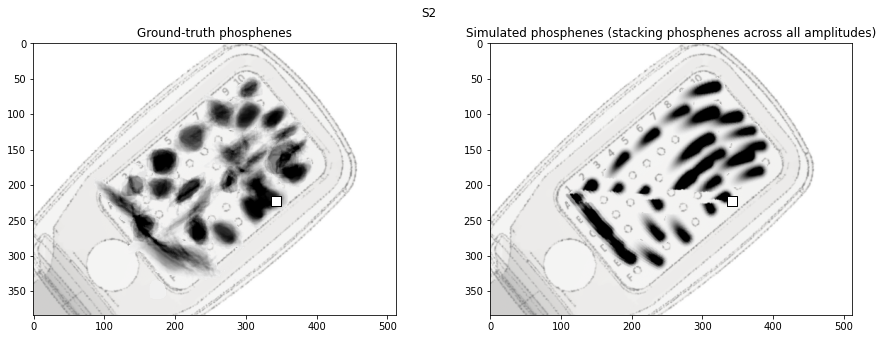

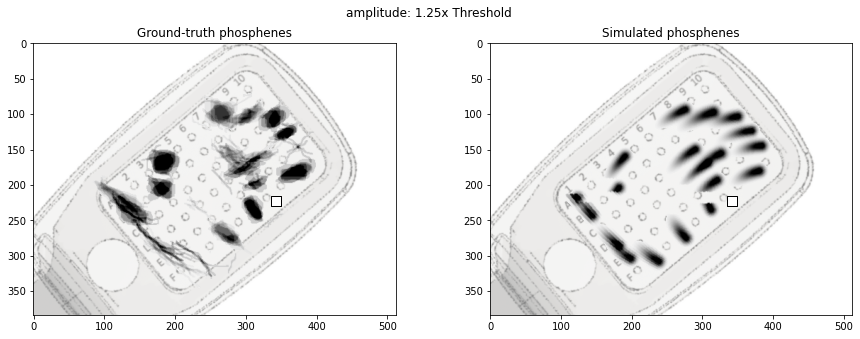

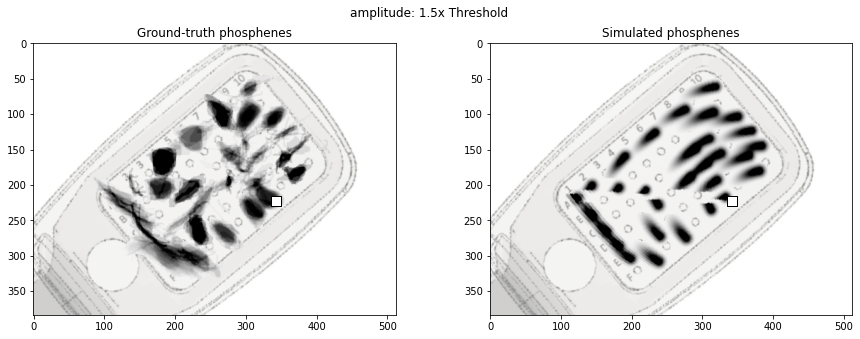

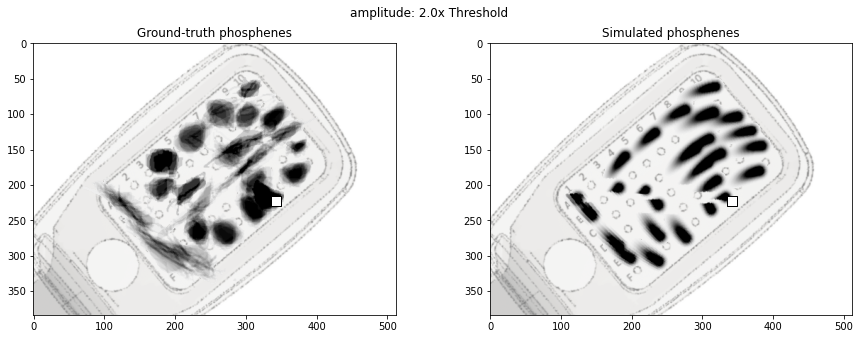

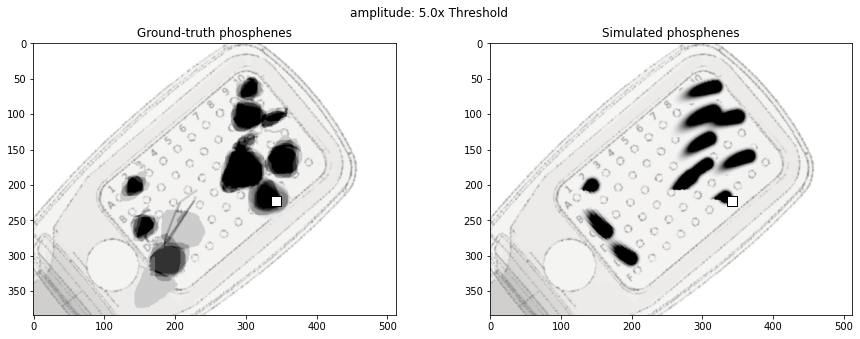

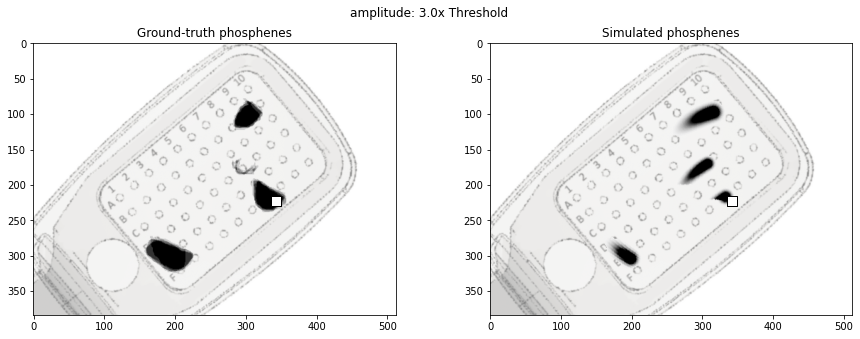

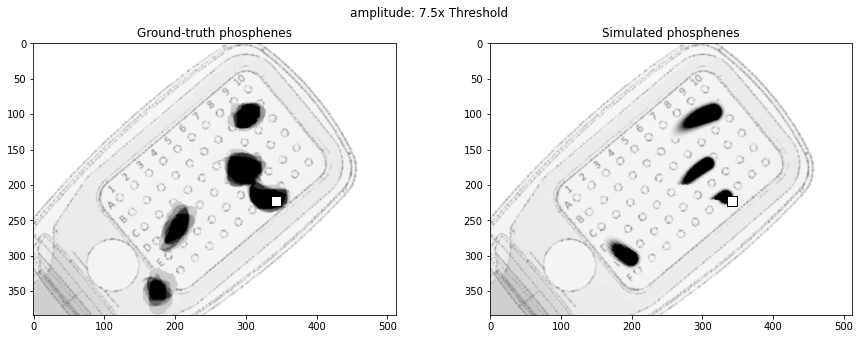

In [14]:
from pulse2percept.viz import plot_argus_phosphenes
from pulse2percept.implants import ArgusII
fig, (ax_data, ax_sim) = plt.subplots(ncols=2, figsize=(15, 5))
argus = ArgusII(x=-1896, y =-542, rot=-44, eye='RE')
plot_argus_phosphenes(df_actual, argus, ax=ax_data,scale=1)
plot_argus_phosphenes(df_pred, argus,ax=ax_sim,scale=1)
ax_data.set_title('Ground-truth phosphenes')
ax_sim.set_title('Simulated phosphenes (stacking phosphenes across all amplitudes)')
fig.suptitle('S2')

for i in range(len(x.amp1.unique())):
    amp_temp=x.amp1.unique()[i]
    df_actual_temp=df_actual[df_actual['amp']==amp_temp]
    df_pred_temp=df_pred[df_pred['amp']==amp_temp]
    fig, (ax_data, ax_sim) = plt.subplots(ncols=2, figsize=(15, 5))
    plot_argus_phosphenes(df_actual_temp, argus, ax=ax_data,scale=1)
    plot_argus_phosphenes(df_pred_temp, argus,ax=ax_sim,scale=1)
    ax_data.set_title('Ground-truth phosphenes')
    ax_sim.set_title('Simulated phosphenes')
    fig.suptitle('amplitude: ' + str(amp_temp) + 'x Threshold')

In [15]:
df = pd.read_csv('/home/yuchen/shapes/estimator05xystep/axon.csv')
df = df[(df['subject'] == 's3') & ~df['test_orientation'].isna()]
df = df.sort_values(df.columns[0]).reset_index(drop=True)
df

,electrode,rho,axlambda,train_combined,train_area,train_MSE_major_axis_length,train_MSE_minor_axis_length,test_combined,test_M00,test_M02,...,test_M22,test_area,test_eccentricity,test_major_axis_length,test_minor_axis_length,test_orientation,train_size,test_size,filename,subject
0,A10,24.127473,682.706429,4.279871,1.078358,2.056167,1.145347,3.581797e+03,2.812130,6.800958,...,145.951587,1.863342,1.012732,19.593552,1.852169e+01,1180.968127,84,2,Axon_s3_A10.pickle,s3
1,A6,24.740524,814.153799,4.247466,1.046680,2.072718,1.128068,2.108247e+02,4.249854,1.597153,...,181.674477,4.637908,1.830319,1.000953,6.612073e+00,1.869699,84,2,Axon_s3_A6.pickle,s3
2,B4,16.739050,1026.252759,3.643218,1.013230,1.515370,1.114618,4.595713e+04,9.202804,1.956177,...,1.481276,13.074286,45597.868279,12.648045,3.503449e+00,311.300503,76,10,Axon_s3_B4.pickle,s3
3,B9,24.990036,801.388422,4.248008,1.046551,2.060271,1.141186,1.114176e+03,89.895853,2.287200,...,531.454194,177.372050,1.001158,7.005135,1.722191e+01,24.086577,84,2,Axon_s3_B9.pickle,s3
4,C10,10.000000,1107.498292,4.420554,1.127564,2.083589,1.209401,9.009908e+04,7.104476,75.833189,...,3.200241,14.677560,86036.314946,14.468091,2.210533e+00,3872.902429,84,2,Axon_s3_C10.pickle,s3
5,C3,10.000000,1124.021573,4.188851,1.017298,2.006557,1.164996,3.295627e+03,3.297802,6.692823,...,7.420774,10.515326,3198.653463,28.726551,1.300422e+00,16.776372,84,2,Axon_s3_C3.pickle,s3
6,C5,25.027850,811.496888,3.821864,0.972539,1.815203,1.034123,7.916824e+03,3.851080,1.690607,...,1.561703,6.164845,7878.955798,9.328080,7.243996e+00,1.000621,77,9,Axon_s3_C5.pickle,s3
7,C6,24.675527,803.920134,4.367678,1.121986,2.148897,1.096796,4.688659e+06,1.106879,4.628328,...,2.236983,19.256198,7.773452,103.155447,4.688508e+06,1.636039,84,2,Axon_s3_C6.pickle,s3
8,C8,10.000000,1106.406750,4.284885,1.005068,2.153419,1.126398,1.597223e+05,4.321087,2.700818,...,2.373267,8.640121,159424.476288,12.055127,2.902528e+00,254.849915,76,10,Axon_s3_C8.pickle,s3
9,D3,24.625370,818.206739,4.217373,1.063713,2.036874,1.116786,6.545149e+04,1.648484,1.079041,...,1.710192,1.038457,30646.828541,6.094819,4.753213e+00,4.355852,84,2,Axon_s3_D3.pickle,s3


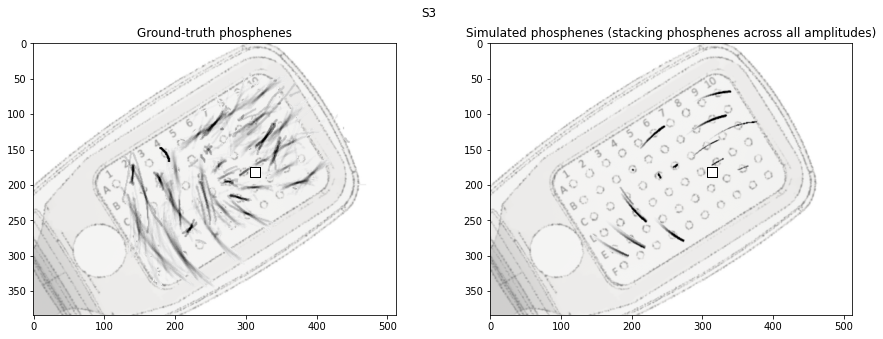

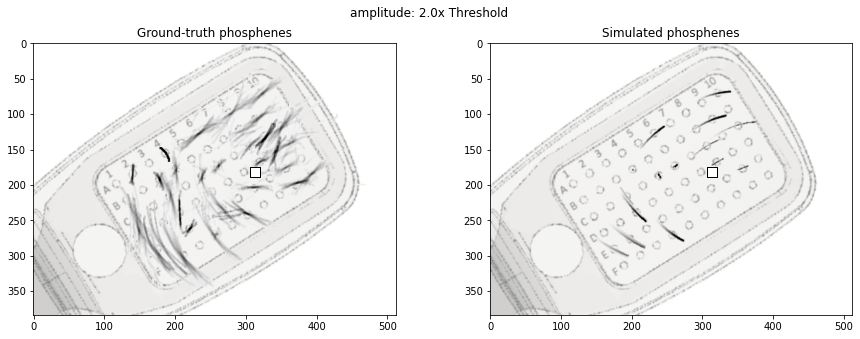

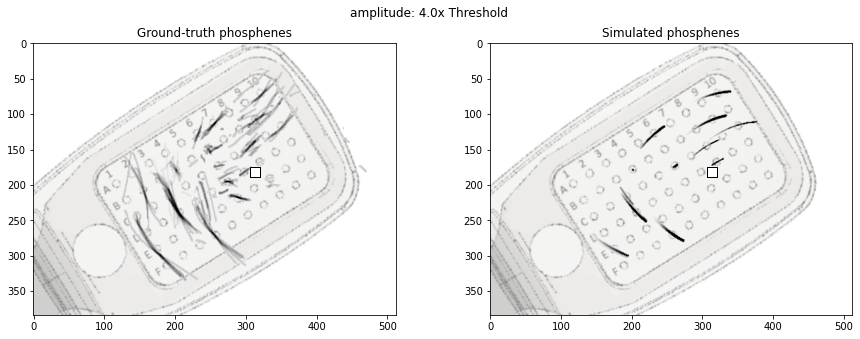

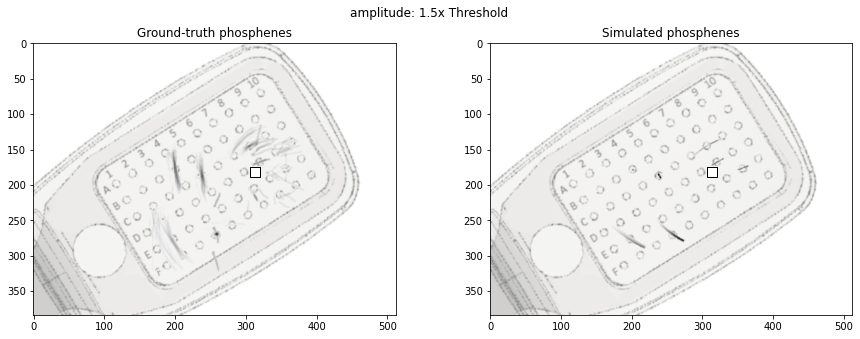

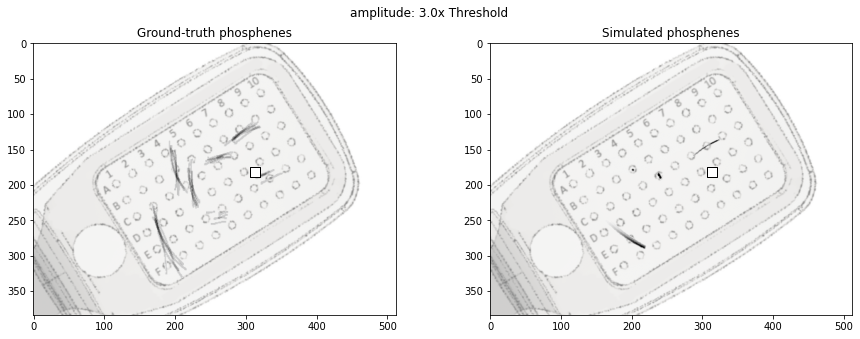

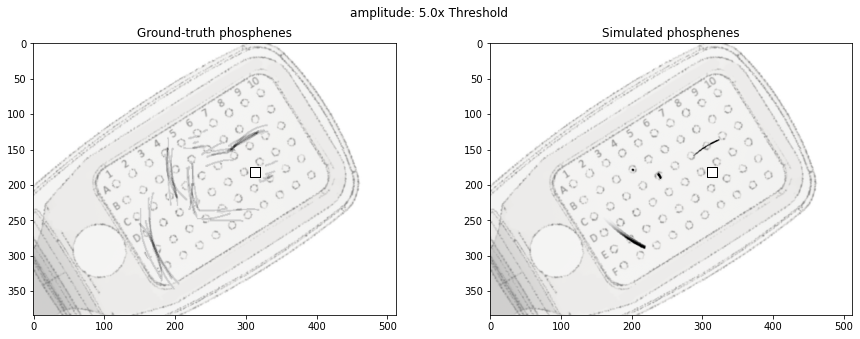

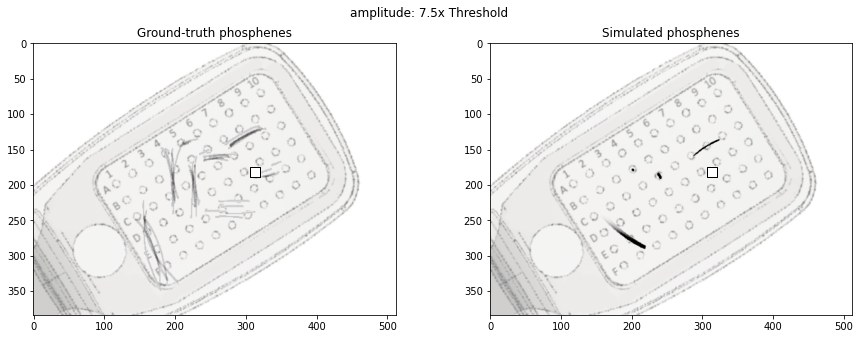

In [16]:
s3 = shapes.subject_params['51-009']
implant, model = shapes.model_from_params(s3, biphasic=False)
model.xystep=0.125

estimator = shapes.AxonMapEstimator(implant=implant, model=model, mse_params=['area', "major_axis_length", "minor_axis_length"], loss_fn='r2', scale_features=False, resize=True)
search_params = {
    'rho': (10, 1000),
    'axlambda': (10, 2000)
}
opt = ParticleSwarmOptimizer(estimator, search_params, max_iter=100, swarm_size=20, has_loss_function=True)

data = shapes.load_shapes("/home/yuchen/shapes/data/shapes.h5", subjects=['51-009'],stim_class=None)
data = data[data['electrode2'] == str()].reset_index(drop=True)
x = data[['amp1', 'freq', 'pdur', 'electrode1']]
y = data['image']

y_moments = estimator.compute_moments(y)
averaged_moments = data
averaged_moments[['area', 'eccentricity', 'orientation']] = y_moments
averaged_moments = averaged_moments.groupby(['electrode1','amp1', 'freq','pdur'])['area', 'eccentricity', 'orientation'].mean()
x = averaged_moments.index.to_frame().reset_index(drop=True)

x = x[x.electrode1.isin(df.electrode)].reset_index(drop=True)

df_pred = pd.DataFrame()
for i in range(len(df)):
    electrode =  df.electrode[i]
    x_temp = x[x['electrode1']==electrode].reset_index(drop=True)
    df_temp = df[df['electrode']==electrode].reset_index(drop=True)
    
    # set estimator parameters and predict percepts for each leave-one-electrode-out cross validation group
    params = {'rho':df_temp.rho[0], 'axlambda':df_temp.axlambda[0]}
    estimator.set_params(**params)
    estimator.fit(x_temp,averaged_moments.loc[[(electrode)]])
    preds = estimator.predict(x_temp)
    df_pred = pd.concat([df_pred, preds], axis = 0)
x['pred']=df_pred.iloc[:, 0].tolist()

# construct dataframes
from pulse2percept.datasets import fetch_beyeler2019
data1 = fetch_beyeler2019(subjects='S3')
df_pred = pd.DataFrame({
    'subject':'S3',
    'image':x.pred,
    'electrode':x.electrode1
})
from pulse2percept.utils import center_image, trim_image, scale_image
from skimage import measure
from skimage.transform import resize
df_pred['xrange']=data1.xrange
df_pred['yrange']=data1.yrange
df_pred['amp'] = x.amp1
df_pred['freq']=x.freq
# for i in range(len(df_pred)):
#     df_pred['image'][i] = resize(center_image(preds[i] > (preds[i].max() - preds[i].min()) * 0.1 + preds[i].min()), y[i].shape)
    
df_actual = data[['subject','image','electrode1','amp1','freq']]
df_actual['subject'] = 'S3'
df_actual['xrange']=[(-30.0, 30.0)]*len(df_actual)
df_actual['yrange']=[(-22.5, 22.5)]*len(df_actual)
df_actual=df_actual.rename(columns={"electrode1": "electrode",'amp1':'amp'})


fig, (ax_data, ax_sim) = plt.subplots(ncols=2, figsize=(15, 5))
argus = ArgusII(x=-1203, y = 280, rot=-35, eye='RE')
plot_argus_phosphenes(df_actual, argus, ax=ax_data,scale=1)
plot_argus_phosphenes(df_pred, argus,ax=ax_sim,scale=1)
ax_data.set_title('Ground-truth phosphenes')
ax_sim.set_title('Simulated phosphenes (stacking phosphenes across all amplitudes)')
fig.suptitle('S3')

for i in range(len(x.amp1.unique())):
    amp_temp=x.amp1.unique()[i]
    df_actual_temp=df_actual[df_actual['amp']==amp_temp]
    df_pred_temp=df_pred[df_pred['amp']==amp_temp]
    fig, (ax_data, ax_sim) = plt.subplots(ncols=2, figsize=(15, 5))
    plot_argus_phosphenes(df_actual_temp, argus, ax=ax_data,scale=1)
    plot_argus_phosphenes(df_pred_temp, argus,ax=ax_sim,scale=1)
    ax_data.set_title('Ground-truth phosphenes')
    ax_sim.set_title('Simulated phosphenes')
    fig.suptitle('amplitude: ' + str(amp_temp) + 'x Threshold')

In [17]:
df = pd.read_csv('/home/yuchen/shapes/estimator05xystep/biphasic.csv')
df = df[(df['subject'] == 's4') & ~df['test_orientation'].isna()]
df = df.sort_values(df.columns[0]).reset_index(drop=True)
df

,electrode,rho,axlambda,train_combined,train_area,train_MSE_major_axis_length,train_MSE_minor_axis_length,test_combined,test_M00,test_M02,...,test_M22,test_area,test_eccentricity,test_major_axis_length,test_minor_axis_length,test_orientation,train_size,test_size,filename,subject
0,A1,282.772933,785.192122,3.340890,1.048282,1.292327,1.000281,2.957449e+05,11.336093,1.261855,...,83.790010,11.336093,6.079950e+02,1.595901e+05,52.057646,132664.848302,97,2,Axon_s4_A1.pickle,s4
1,A10,242.584896,1411.308726,3.362926,1.029710,1.338078,0.995137,1.434855e+08,62.158061,1142.221640,...,35883.071181,57.072743,1.433616e+08,6.637678e+01,39642.091842,25.267853,97,2,Axon_s4_A10.pickle,s4
2,A5,191.628093,1571.944509,3.186446,1.003674,1.203359,0.979413,1.909235e+01,1.501383,1.322341,...,1.199722,1.501383,1.110232e+00,1.821148e+00,1.537809,3.426084,87,12,Axon_s4_A5.pickle,s4
3,A7,219.411493,1086.371359,3.348328,1.054188,1.308032,0.986107,2.521871e+01,1.277179,2.116288,...,2.012465,1.277179,1.630268e+00,1.971864e+00,3.489634,2.005176,97,2,Axon_s4_A7.pickle,s4
4,A8,231.391078,1327.100237,3.332415,1.049913,1.291961,0.990541,4.165032e+01,12.526309,1.372724,...,1.516516,12.266938,1.014477e+00,1.326131e+00,1.084622,4.108942,96,3,Axon_s4_A8.pickle,s4
5,B7,205.634465,1197.344944,3.349374,1.065781,1.289871,0.993722,4.107521e+01,2.556745,1.460939,...,1.500347,2.543562,1.204139e+01,1.807439e+00,1.067765,11.778624,96,3,Axon_s4_B7.pickle,s4
6,B9,227.404737,1272.153621,3.356020,1.062276,1.300624,0.993121,1.844129e+01,1.027366,1.548807,...,1.493400,1.027366,2.218855e+00,1.415680e+00,1.956671,1.449656,96,3,Axon_s4_B9.pickle,s4
7,C10,223.100807,1442.157976,3.340973,1.042355,1.300345,0.998273,3.366204e+01,6.698772,1.001532,...,1.334010,6.698772,1.176272e+00,1.091493e+00,1.018424,4.289795,96,3,Axon_s4_C10.pickle,s4
8,D7,213.874932,1685.848374,3.433713,1.080117,1.350199,1.003398,4.175064e+03,298.029368,1223.923302,...,961.662789,298.029368,2.595557e+01,2.756953e+01,54.277490,81.982566,96,3,Axon_s4_D7.pickle,s4
9,D8,226.917226,1261.112913,3.414947,1.068564,1.339068,1.007316,2.682366e+02,39.434437,3.489995,...,2.066991,37.886063,4.642617e+00,3.457745e+00,4.221712,166.591430,96,3,Axon_s4_D8.pickle,s4


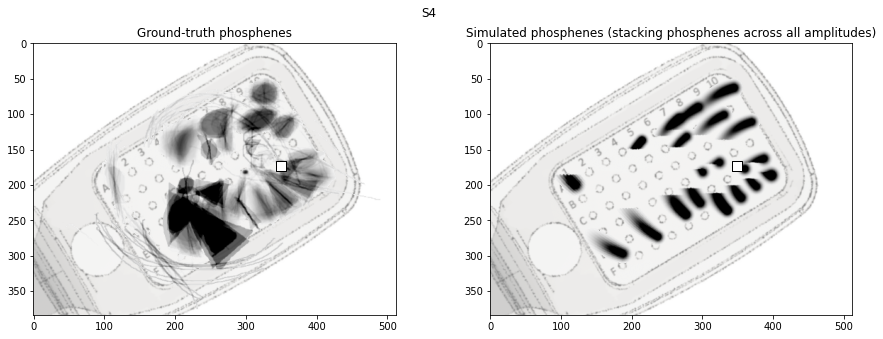

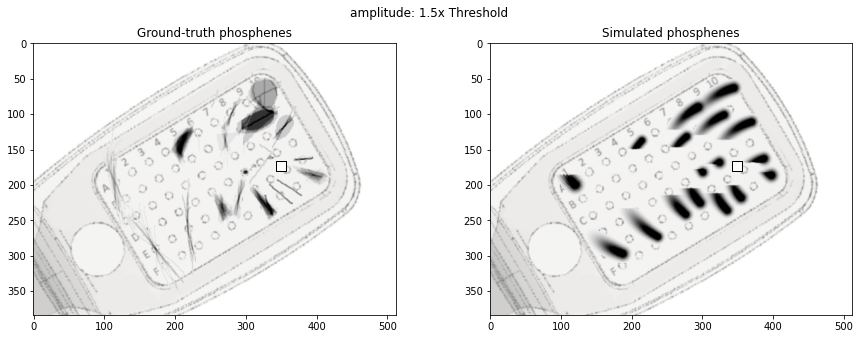

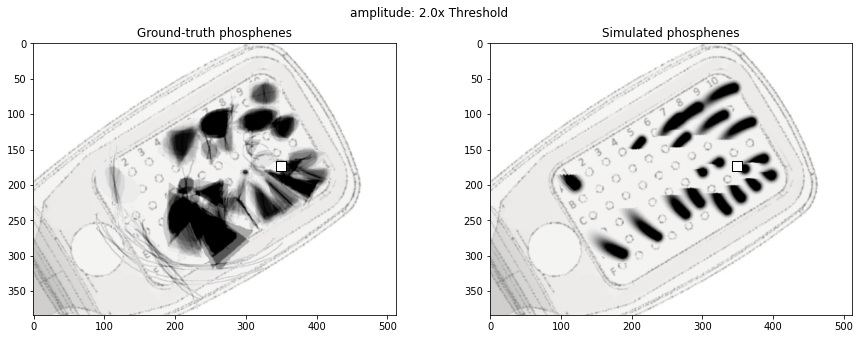

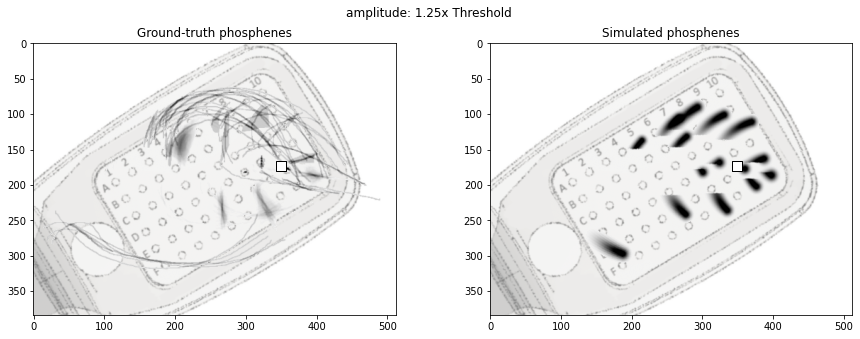

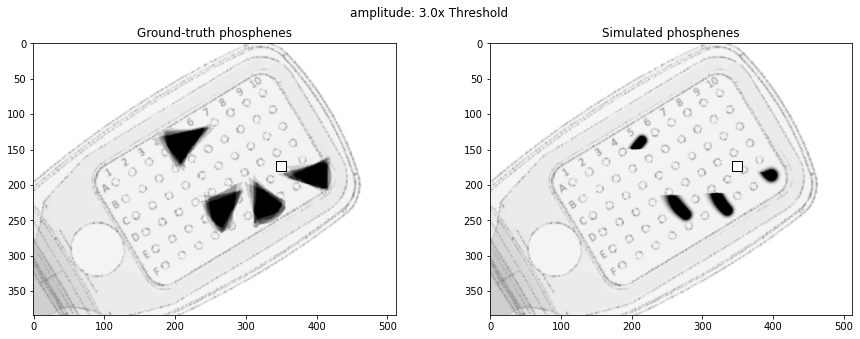

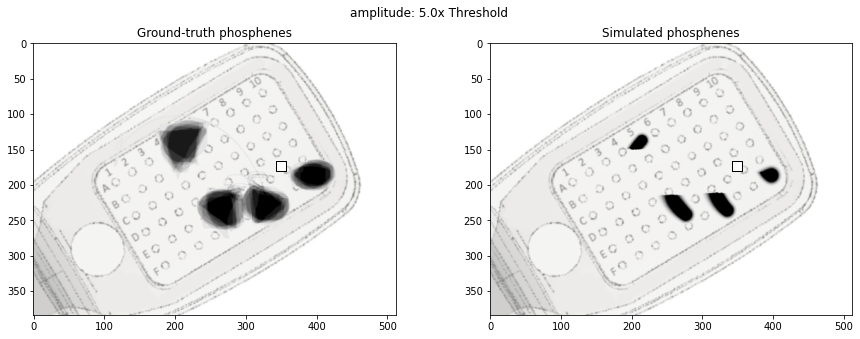

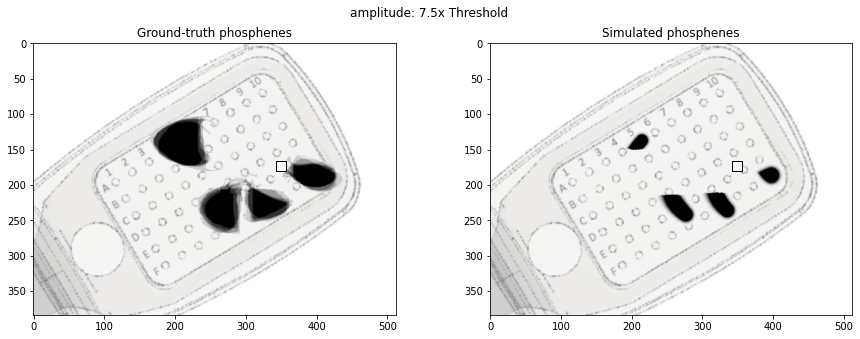

In [19]:
s4 = shapes.subject_params['52-001']
implant, model = shapes.model_from_params(s4, biphasic=False)
model.xystep=0.125

estimator = shapes.AxonMapEstimator(implant=implant, model=model, mse_params=['area', "major_axis_length", "minor_axis_length"], loss_fn='r2', scale_features=False, resize=True)
search_params = {
    'rho': (10, 1000),
    'axlambda': (10, 2000)
}
opt = ParticleSwarmOptimizer(estimator, search_params, max_iter=100, swarm_size=20, has_loss_function=True)

data = shapes.load_shapes("/home/yuchen/shapes/data/shapes.h5", subjects=['52-001'],stim_class=None)
data = data[data['electrode2'] == str()].reset_index(drop=True)
x = data[['amp1', 'freq', 'pdur', 'electrode1']]
y = data['image']

y_moments = estimator.compute_moments(y)
averaged_moments = data
averaged_moments[['area', 'eccentricity', 'orientation']] = y_moments
averaged_moments = averaged_moments.groupby(['electrode1','amp1', 'freq','pdur'])['area', 'eccentricity', 'orientation'].mean()
x = averaged_moments.index.to_frame().reset_index(drop=True)

x = x[x.electrode1.isin(df.electrode)].reset_index(drop=True)

df_pred = pd.DataFrame()
for i in range(len(df)):
    electrode =  df.electrode[i]
    x_temp = x[x['electrode1']==electrode].reset_index(drop=True)
    df_temp = df[df['electrode']==electrode].reset_index(drop=True)
    
    # set estimator parameters and predict percepts for each leave-one-electrode-out cross validation group
    params = {'rho':df_temp.rho[0], 'axlambda':df_temp.axlambda[0]}
    estimator.set_params(**params)
    estimator.fit(x_temp,averaged_moments.loc[[(electrode)]])
    preds = estimator.predict(x_temp)
    df_pred = pd.concat([df_pred, preds], axis = 0)
x['pred']=df_pred.iloc[:, 0].tolist()

# construct dataframes
from pulse2percept.datasets import fetch_beyeler2019
data1 = fetch_beyeler2019(subjects='S4')
df_pred = pd.DataFrame({
    'subject':'S4',
    'image':x.pred,
    'electrode':x.electrode1
})
df_pred['xrange']=data1.xrange
df_pred['yrange']=data1.yrange
df_pred['amp'] = x.amp1
df_pred['freq']=x.freq
# for i in range(len(df_pred)):
#     df_pred['image'][i] = resize(center_image(preds[i] > (preds[i].max() - preds[i].min()) * 0.1 + preds[i].min()), y[i].shape)
    
df_actual = data[['subject','image','electrode1','amp1','freq']]
df_actual['subject'] = 'S4'
df_actual['xrange']=[(-30.0, 30.0)]*len(df_actual)
df_actual['yrange']=[(-22.5, 22.5)]*len(df_actual)
df_actual=df_actual.rename(columns={"electrode1": "electrode",'amp1':'amp'})

# plot
fig, (ax_data, ax_sim) = plt.subplots(ncols=2, figsize=(15, 5))
argus = ArgusII(x=-1945, y = 469, rot=-34, eye='RE')
plot_argus_phosphenes(df_actual, argus, ax=ax_data,scale=0.7)
plot_argus_phosphenes(df_pred, argus,ax=ax_sim,scale=0.7)
ax_data.set_title('Ground-truth phosphenes')
ax_sim.set_title('Simulated phosphenes (stacking phosphenes across all amplitudes)')
fig.suptitle('S4')

for i in range(len(x.amp1.unique())):
    amp_temp=x.amp1.unique()[i]
    df_actual_temp=df_actual[df_actual['amp']==amp_temp]
    df_pred_temp=df_pred[df_pred['amp']==amp_temp]
    fig, (ax_data, ax_sim) = plt.subplots(ncols=2, figsize=(15, 5))
    plot_argus_phosphenes(df_actual_temp, argus, ax=ax_data,scale=0.7)
    plot_argus_phosphenes(df_pred_temp, argus,ax=ax_sim,scale=0.7)
    ax_data.set_title('Ground-truth phosphenes')
    ax_sim.set_title('Simulated phosphenes')
    fig.suptitle('amplitude: ' + str(amp_temp) + 'x Threshold')

Biphasic:

In [3]:
df = pd.read_csv('/home/yuchen/shapes/estimator05xystep/biphasic.csv')
df = df[(df['subject'] == 's2') & ~df['test_orientation'].isna()]
df = df.sort_values(df.columns[0]).reset_index(drop=True)
df

,electrode,rho,axlambda,a5,train_combined,train_area,train_MSE_major_axis_length,train_MSE_minor_axis_length,test_combined,test_M00,...,test_M22,test_area,test_eccentricity,test_major_axis_length,test_minor_axis_length,test_orientation,train_size,test_size,filename,subject
0,A1,151.951038,554.741621,0.315505,2.935597,0.923043,1.280853,0.731701,7.474991e+03,4.270447,...,36.644280,4.131844,6.878256e+03,274.396384,103.505877,26.862018,107,3,Biphasic_s2_A1.pickle,s2
1,A10,158.143045,576.722287,0.315505,3.061954,0.934884,1.399021,0.728049,3.568999e+02,13.045578,...,1.858948,12.400877,2.338675e+00,194.484867,1.805986,28.519607,107,3,Biphasic_s2_A10.pickle,s2
2,A2,134.964947,636.998663,0.315505,3.103464,0.928888,1.441018,0.733558,4.414852e+01,0.249668,...,1.855973,0.249668,2.757003e+00,21.712357,0.242006,12.734738,108,2,Biphasic_s2_A2.pickle,s2
3,A4,147.878517,623.939784,0.315505,3.062014,0.923049,1.433374,0.705591,2.336246e+03,7.403259,...,2.571589,7.403259,9.849949e+02,32.117594,142.587058,609.677625,107,3,Biphasic_s2_A4.pickle,s2
4,A6,154.571789,544.346717,0.315505,3.073807,0.909358,1.437613,0.726836,2.025949e+02,1.292471,...,3.847020,0.491767,6.917908e+01,3.947918,12.061171,5.757455,108,2,Biphasic_s2_A6.pickle,s2
5,A8,155.028526,565.948637,0.315505,3.073722,0.916211,1.433447,0.724064,5.468756e+01,0.428071,...,2.166885,0.476188,1.194913e+01,0.776704,1.549613,28.164618,107,3,Biphasic_s2_A8.pickle,s2
6,B1,151.789559,550.717451,0.315505,3.013946,0.929496,1.363660,0.720791,1.100402e+02,1.967654,...,3.907617,1.967654,2.709261e+01,22.552321,4.116334,8.408318,107,3,Biphasic_s2_B1.pickle,s2
7,B3,144.138978,552.356534,0.315505,3.049413,0.899142,1.430694,0.719577,2.923655e+03,62.994890,...,2105.180855,62.994890,1.637879e+01,473.393964,10.408907,5.747983,107,3,Biphasic_s2_B3.pickle,s2
8,B9,147.737199,559.167013,0.315505,3.121159,0.931807,1.449195,0.740157,2.359006e+01,0.788451,...,1.570330,0.782983,2.040588e+00,1.592497,0.972111,5.193929,100,10,Biphasic_s2_B9.pickle,s2
9,C1,155.176143,533.504036,0.315505,3.061877,0.892223,1.434323,0.735330,6.040342e+01,2.459111,...,4.768562,2.459111,5.610432e-01,1.796875,0.207288,2.457482,108,2,Biphasic_s2_C1.pickle,s2


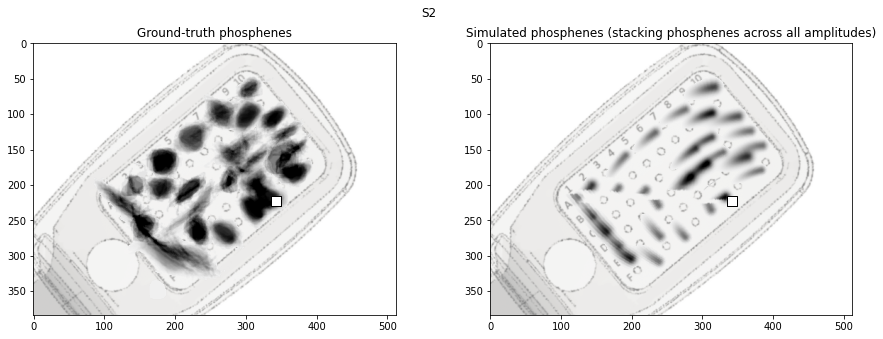

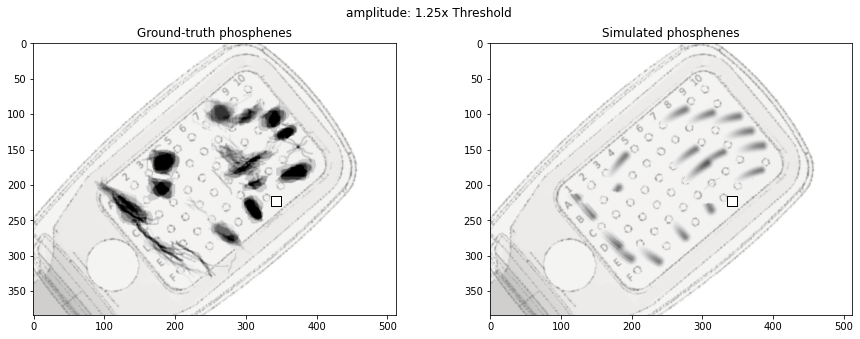

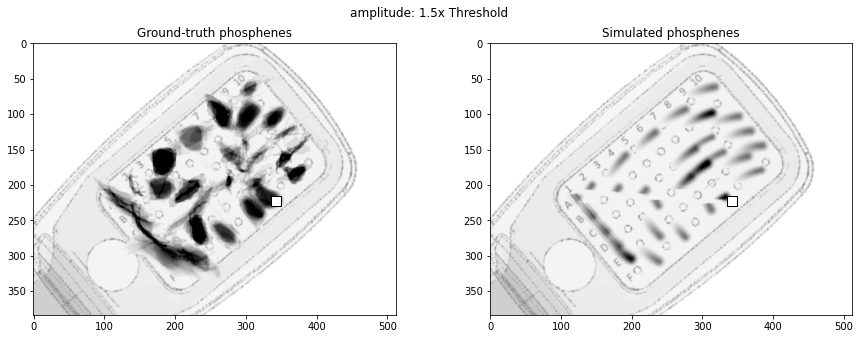

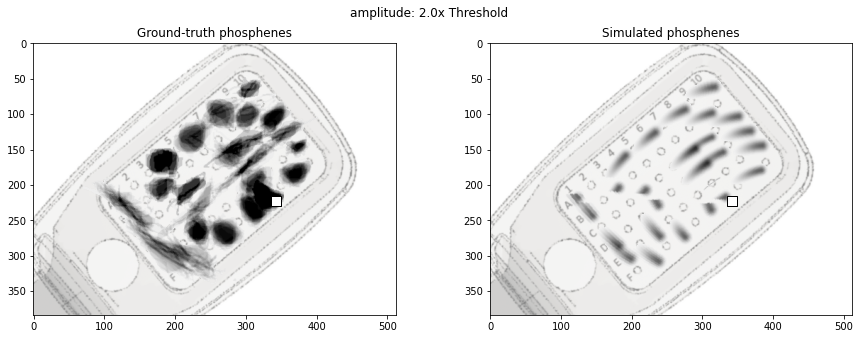

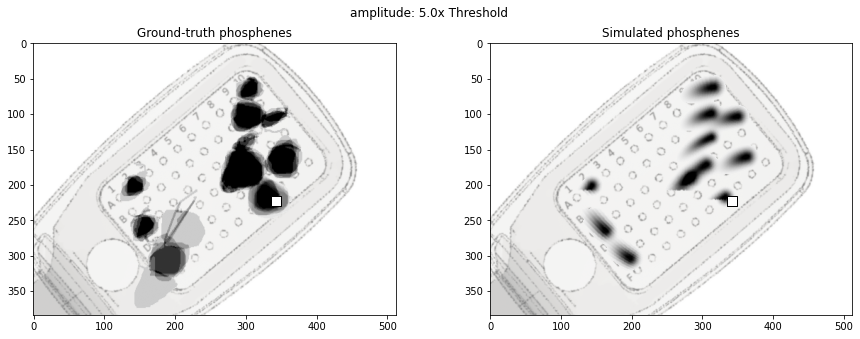

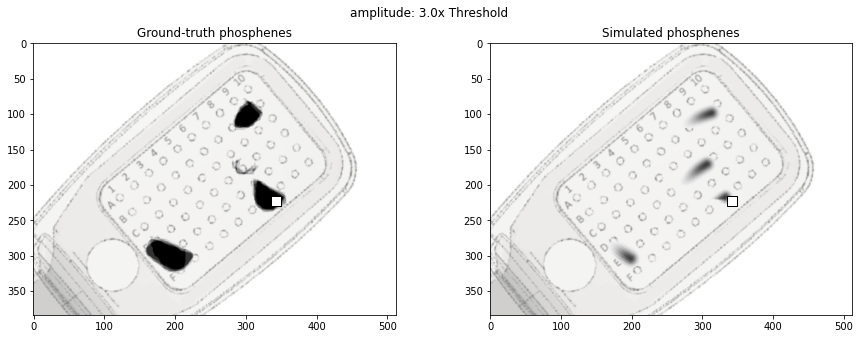

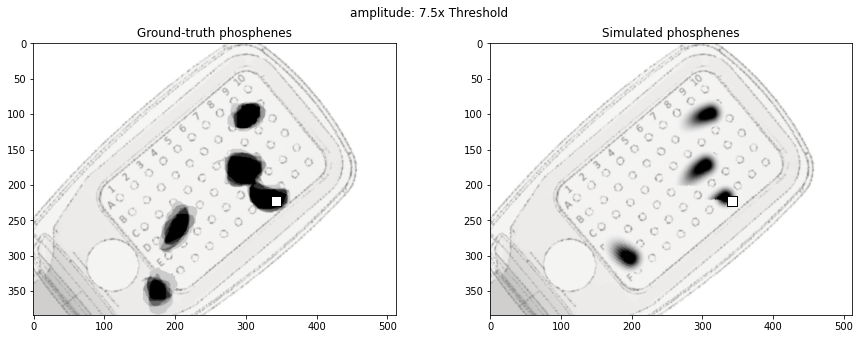

In [10]:
s2 = shapes.subject_params['12-005']
implant, model = shapes.model_from_params(s2)
model.xystep=0.125

estimator = shapes.BiphasicAxonMapEstimator(implant=implant, model=model,resize=True,scale_features=False, threshold='compute', loss_fn='r2',mse_params=['area',"major_axis_length", "minor_axis_length"])
search_params = {
    'rho': (10, 1000),
    'axlambda': (10, 2500)
}
opt = ParticleSwarmOptimizer(estimator, search_params, max_iter=100, swarm_size=20, has_loss_function=True)

data = shapes.load_shapes("/home/yuchen/shapes/data/shapes.h5", subjects=['12-005'], stim_class=None)
data = data[data['electrode2'] == str()].reset_index(drop=True)
x = data[['amp1', 'freq', 'pdur', 'electrode1']]
y = data['image']

y_moments = estimator.compute_moments(y)
averaged_moments = data
averaged_moments[['area', 'eccentricity','compactness']] = y_moments
averaged_moments = averaged_moments.groupby(['electrode1','amp1', 'freq','pdur'])['area', 'eccentricity','compactness'].mean()
x = averaged_moments.index.to_frame().reset_index(drop=True)

df_pred = pd.DataFrame()
for i in range(len(df)):
    electrode =  df.electrode[i]
    x_temp = x[x['electrode1']==electrode].reset_index(drop=True)
    df_temp = df[df['electrode']==electrode].reset_index(drop=True)
    
    # set estimator parameters and predict percepts for each leave-one-electrode-out cross validation group
    params = {'rho':df_temp.rho[0], 'axlambda':df_temp.axlambda[0], 'a5':df_temp.a5[0]}
    estimator.set_params(**params)
    estimator.fit(x_temp,averaged_moments.loc[[(electrode)]])
    preds = estimator.predict(x_temp)
    df_pred = pd.concat([df_pred, preds], axis = 0)
x['pred']=df_pred.iloc[:, 0].tolist()

# construct dataframes
from pulse2percept.datasets import fetch_beyeler2019
data1 = fetch_beyeler2019(subjects='S2')
df_pred = pd.DataFrame({
    'subject':'S2',
    'image':x.pred,
    'electrode':x.electrode1
})

df_pred['xrange']=data1.xrange
df_pred['yrange']=data1.yrange
df_pred['amp'] = x.amp1
df_pred['freq']=x.freq
# for i in range(len(df_pred)):
#     df_pred['image'][i] = resize(center_image(x.pred[i] > (x.pred[i].max() - x.pred[i].min()) * 0.1 + x.pred[i].min()), y[i].shape)
    
df_actual = data[['subject','image','electrode1','amp1','freq']]
df_actual['subject'] = 'S2'
df_actual['xrange']=[(-30.0, 30.0)]*len(df_actual)
df_actual['yrange']=[(-22.5, 22.5)]*len(df_actual)
df_actual=df_actual.rename(columns={"electrode1": "electrode",'amp1':'amp'})

from pulse2percept.viz import plot_argus_phosphenes
from pulse2percept.implants import ArgusII
fig, (ax_data, ax_sim) = plt.subplots(ncols=2, figsize=(15, 5))
argus = ArgusII(x=-1896, y =-542, rot=-44, eye='RE')
plot_argus_phosphenes(df_actual, argus, ax=ax_data,scale=1)
plot_argus_phosphenes(df_pred, argus,ax=ax_sim,scale=1)
ax_data.set_title('Ground-truth phosphenes')
ax_sim.set_title('Simulated phosphenes (stacking phosphenes across all amplitudes)')
fig.suptitle('S2')

for i in range(len(x.amp1.unique())):
    amp_temp=x.amp1.unique()[i]
    df_actual_temp=df_actual[df_actual['amp']==amp_temp]
    df_pred_temp=df_pred[df_pred['amp']==amp_temp]
    fig, (ax_data, ax_sim) = plt.subplots(ncols=2, figsize=(15, 5))
    plot_argus_phosphenes(df_actual_temp, argus, ax=ax_data,scale=1)
    plot_argus_phosphenes(df_pred_temp, argus,ax=ax_sim,scale=1)
    ax_data.set_title('Ground-truth phosphenes')
    ax_sim.set_title('Simulated phosphenes')
    fig.suptitle('amplitude: ' + str(amp_temp) + 'x Threshold')

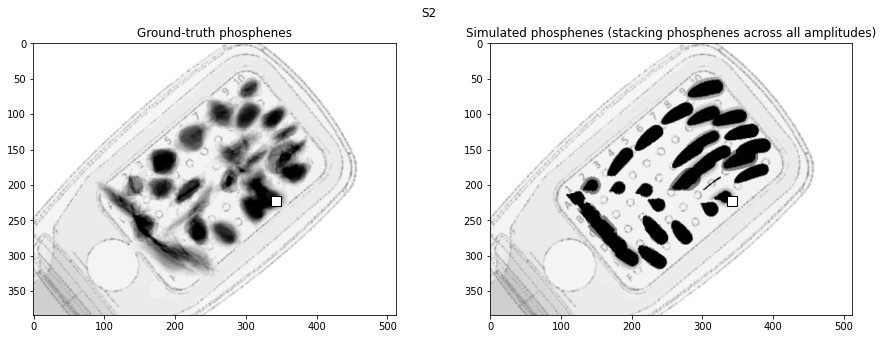

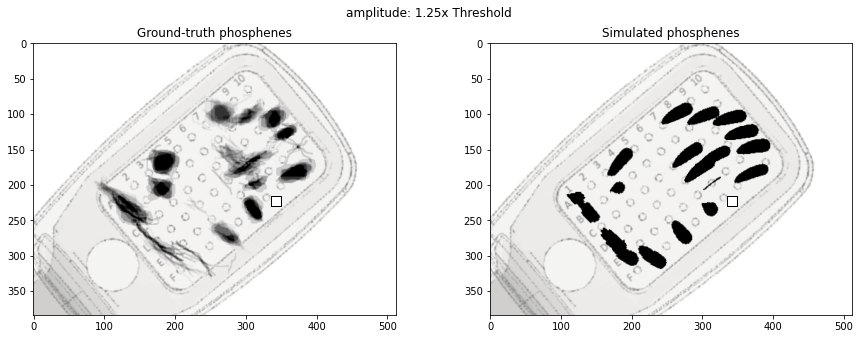

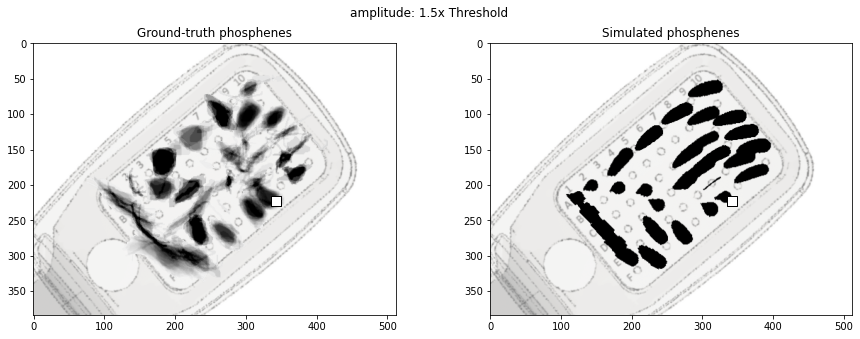

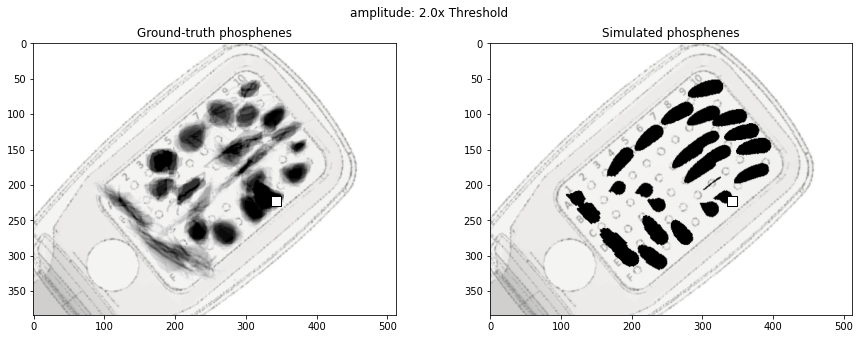

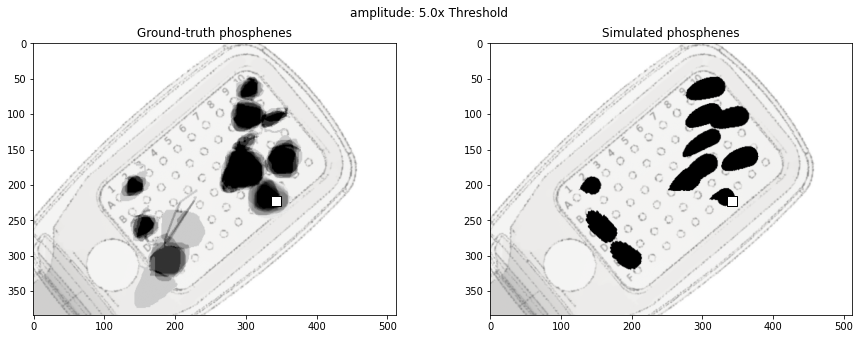

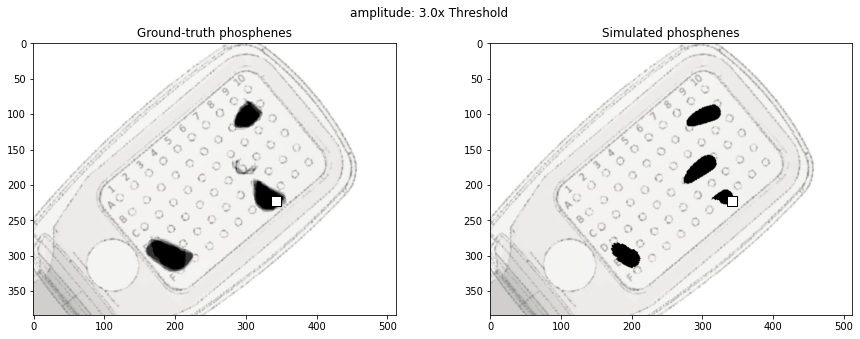

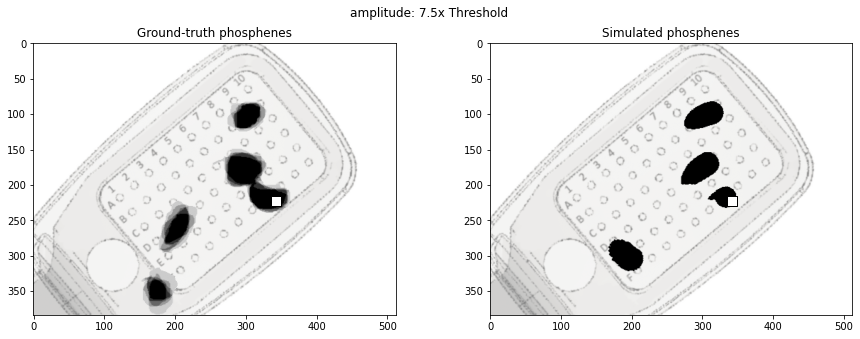

In [11]:
# construct dataframes
from pulse2percept.datasets import fetch_beyeler2019
data1 = fetch_beyeler2019(subjects='S2')
df_pred = pd.DataFrame({
    'subject':'S2',
    'image':x.pred,
    'electrode':x.electrode1
})

df_pred['xrange']=data1.xrange
df_pred['yrange']=data1.yrange
df_pred['amp'] = x.amp1
df_pred['freq']=x.freq
for i in range(len(df_pred)):
    df_pred['image'][i] = resize(center_image(x.pred[i] > (x.pred[i].max() - x.pred[i].min()) * 0.1 + x.pred[i].min()), y[i].shape)
    
df_actual = data[['subject','image','electrode1','amp1','freq']]
df_actual['subject'] = 'S2'
df_actual['xrange']=[(-30.0, 30.0)]*len(df_actual)
df_actual['yrange']=[(-22.5, 22.5)]*len(df_actual)
df_actual=df_actual.rename(columns={"electrode1": "electrode",'amp1':'amp'})

from pulse2percept.viz import plot_argus_phosphenes
from pulse2percept.implants import ArgusII
fig, (ax_data, ax_sim) = plt.subplots(ncols=2, figsize=(15, 5))
argus = ArgusII(x=-1896, y =-542, rot=-44, eye='RE')
plot_argus_phosphenes(df_actual, argus, ax=ax_data,scale=1)
plot_argus_phosphenes(df_pred, argus,ax=ax_sim,scale=1)
ax_data.set_title('Ground-truth phosphenes')
ax_sim.set_title('Simulated phosphenes (stacking phosphenes across all amplitudes)')
fig.suptitle('S2')

for i in range(len(x.amp1.unique())):
    amp_temp=x.amp1.unique()[i]
    df_actual_temp=df_actual[df_actual['amp']==amp_temp]
    df_pred_temp=df_pred[df_pred['amp']==amp_temp]
    fig, (ax_data, ax_sim) = plt.subplots(ncols=2, figsize=(15, 5))
    plot_argus_phosphenes(df_actual_temp, argus, ax=ax_data,scale=1)
    plot_argus_phosphenes(df_pred_temp, argus,ax=ax_sim,scale=1)
    ax_data.set_title('Ground-truth phosphenes')
    ax_sim.set_title('Simulated phosphenes')
    fig.suptitle('amplitude: ' + str(amp_temp) + 'x Threshold')

In [24]:
df = pd.read_csv('/home/yuchen/shapes/estimator05xystep/biphasic.csv')
df = df[(df['subject'] == 's3') & ~df['test_orientation'].isna()]
df = df.sort_values(df.columns[0]).reset_index(drop=True)
df

,electrode,rho,axlambda,a5,train_combined,train_area,train_MSE_major_axis_length,train_MSE_minor_axis_length,test_combined,test_M00,...,test_M22,test_area,test_eccentricity,test_major_axis_length,test_minor_axis_length,test_orientation,train_size,test_size,filename,subject
0,A10,24.350524,736.422318,0.066319,4.322890,1.079527,2.100460,1.142903,3.511443e+03,5.035174,...,145.445084,3.702739,1.014622,16.886401,2.205065e+01,1178.869783,84,2,Biphasic_s3_A10.pickle,s3
1,A6,17.718966,783.039517,0.066319,4.309814,1.109453,2.058026,1.142335,2.564071e+02,2.489612,...,228.432407,2.180028,4.415365,1.298451,4.383644e+00,1.711135,84,2,Biphasic_s3_A6.pickle,s3
2,B4,24.911824,768.126820,0.066319,3.590327,0.875208,1.580132,1.134987,6.045521e+04,9.042205,...,1.481274,12.818193,60313.416637,12.650113,4.199865e+00,93.550507,76,10,Biphasic_s3_B4.pickle,s3
3,B9,25.044788,681.054205,0.066319,4.367612,1.015516,2.191332,1.160764,1.098161e+03,48.117373,...,560.522781,51.896201,15.896813,36.311478,1.584892e+01,28.040529,84,2,Biphasic_s3_B9.pickle,s3
4,C10,24.287175,747.464687,0.066319,4.304924,1.093316,2.065469,1.146139,4.754003e+02,1.709269,...,3.204941,3.081907,37.278721,5.896337,2.502794e+00,292.259409,84,2,Biphasic_s3_C10.pickle,s3
5,C3,10.000000,978.296923,0.066319,4.240107,1.081456,1.961186,1.197464,3.295861e+03,3.386001,...,7.431595,10.515326,3198.653463,28.726551,1.300422e+00,16.776372,84,2,Biphasic_s3_C3.pickle,s3
6,C5,12.791997,937.690636,0.066319,4.773414,1.529558,2.286999,0.956858,5.594525e+03,4.155411,...,1.561721,7.004403,5557.640722,9.362506,4.881134e+00,1.197752,77,9,Biphasic_s3_C5.pickle,s3
7,C6,22.991317,747.017473,0.066319,4.439230,1.141679,2.179141,1.118410,4.577397e+06,0.978180,...,2.236992,17.140496,7.687182,104.203365,4.577248e+06,1.760413,84,2,Biphasic_s3_C6.pickle,s3
8,C8,10.000000,979.131702,0.066319,4.317515,1.106197,2.061689,1.149629,1.597223e+05,4.285825,...,2.373074,8.640121,159424.476288,12.055127,2.902528e+00,254.849915,76,10,Biphasic_s3_C8.pickle,s3
9,D3,10.000000,1032.075567,0.066319,4.423066,1.295361,1.964322,1.163383,8.651116e+04,1.945141,...,1.467857,1.252091,23195.607053,6.278099,3.201805e+00,4.280055,84,2,Biphasic_s3_D3.pickle,s3


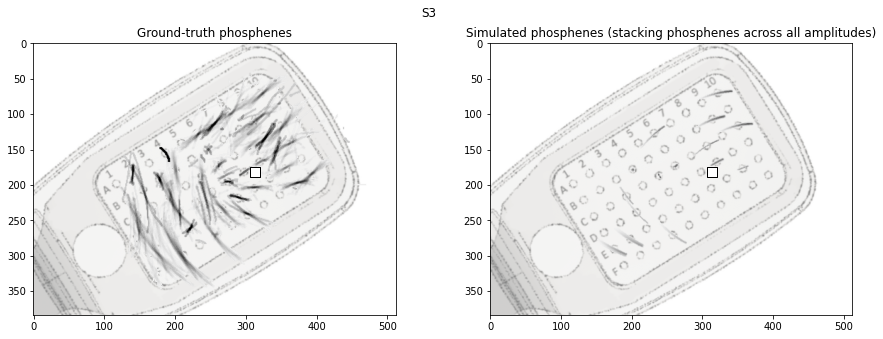

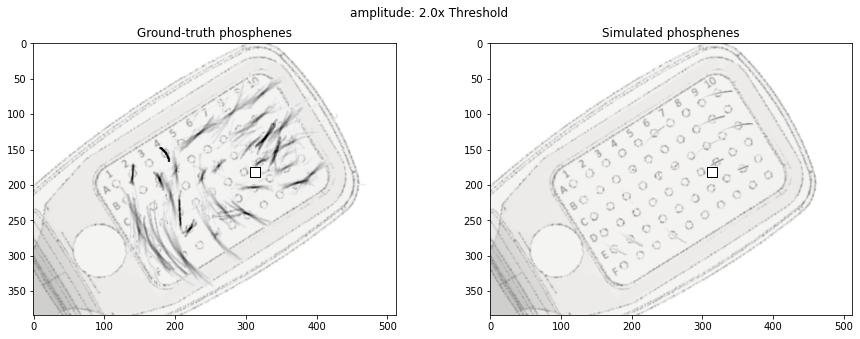

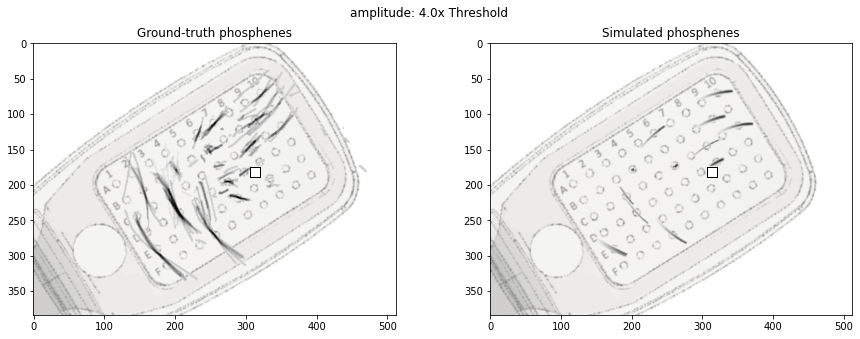

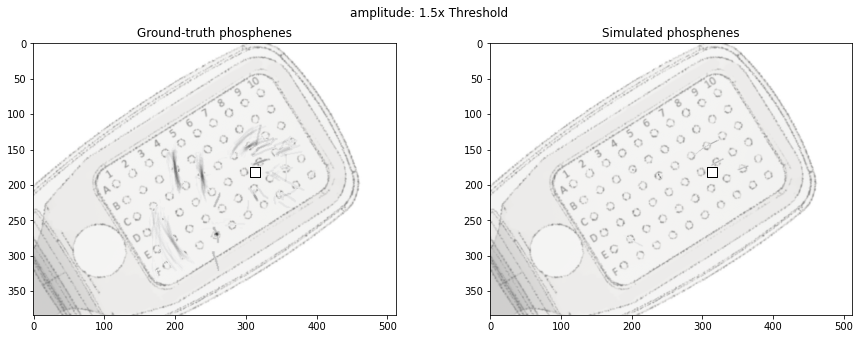

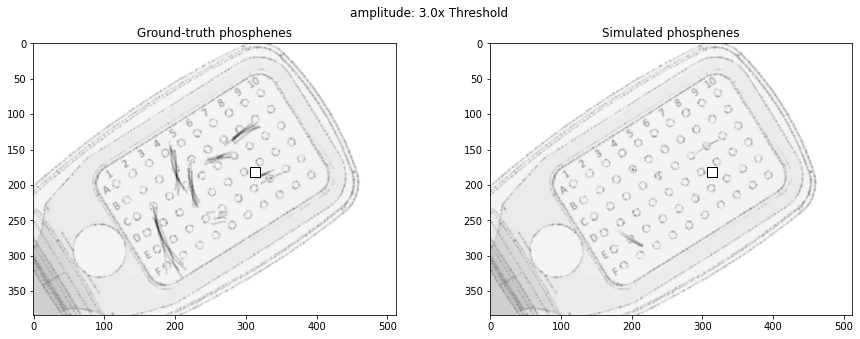

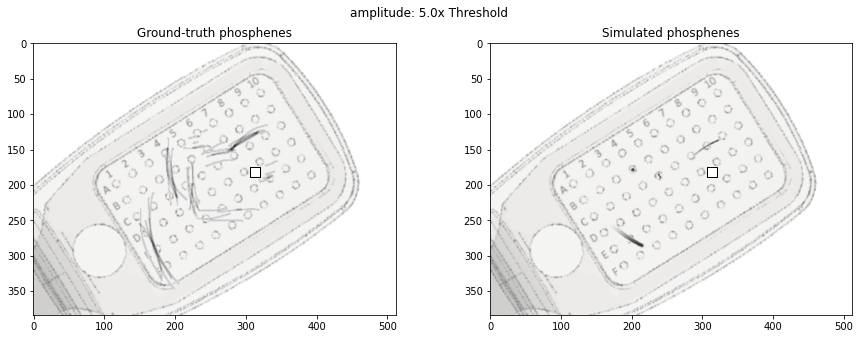

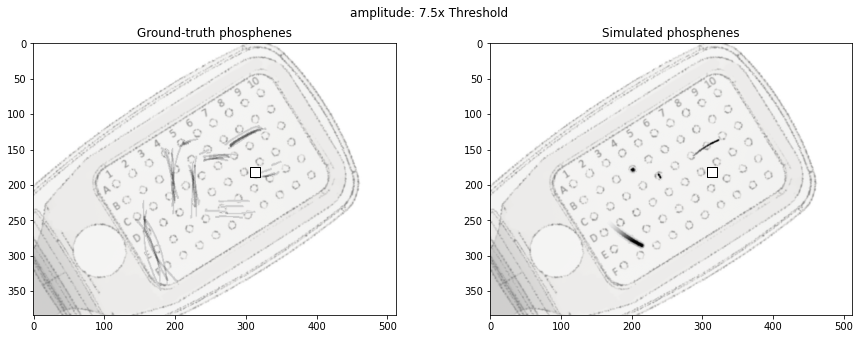

In [25]:
s3 = shapes.subject_params['51-009']
implant, model = shapes.model_from_params(s3)
model.xystep=0.125

estimator = shapes.BiphasicAxonMapEstimator(implant=implant, model=model,resize=True, scale_features=False,threshold='compute', loss_fn='r2',mse_params=['area',"major_axis_length", "minor_axis_length"])
search_params = {
    'rho': (10, 1000),
    'axlambda': (10, 2500)
}
opt = ParticleSwarmOptimizer(estimator, search_params, max_iter=100, swarm_size=20, has_loss_function=True)

data = shapes.load_shapes("/home/yuchen/shapes/data/shapes.h5", subjects=['51-009'], stim_class=None)
data = data[data['electrode2'] == str()].reset_index(drop=True)
x = data[['amp1', 'freq', 'pdur', 'electrode1']]
y = data['image']

y_moments = estimator.compute_moments(y)
averaged_moments = data
averaged_moments[['area', 'eccentricity','compactness']] = y_moments
averaged_moments = averaged_moments.groupby(['electrode1','amp1', 'freq','pdur'])['area', 'eccentricity','compactness'].mean()
x = averaged_moments.index.to_frame().reset_index(drop=True)

x = x[x.electrode1.isin(df.electrode)].reset_index(drop=True)

df_pred = pd.DataFrame()
for i in range(len(df)):
    electrode =  df.electrode[i]
    x_temp = x[x['electrode1']==electrode].reset_index(drop=True)
    df_temp = df[df['electrode']==electrode].reset_index(drop=True)
    
    # set estimator parameters and predict percepts for each leave-one-electrode-out cross validation group
    params = {'rho':df_temp.rho[0], 'axlambda':df_temp.axlambda[0]}
    estimator.set_params(**params)
    estimator.fit(x_temp,averaged_moments.loc[[(electrode)]])
    preds = estimator.predict(x_temp)
    df_pred = pd.concat([df_pred, preds], axis = 0)
x['pred']=df_pred.iloc[:, 0].tolist()

# construct dataframes
from pulse2percept.datasets import fetch_beyeler2019
data1 = fetch_beyeler2019(subjects='S3')
df_pred = pd.DataFrame({
    'subject':'S3',
    'image':x.pred,
    'electrode':x.electrode1
})
from pulse2percept.utils import center_image, trim_image, scale_image
from skimage import measure
from skimage.transform import resize
df_pred['xrange']=data1.xrange
df_pred['yrange']=data1.yrange
df_pred['amp'] = x.amp1
df_pred['freq']=x.freq
# for i in range(len(df_pred)):
#     df_pred['image'][i] = resize(center_image(preds[i] > (preds[i].max() - preds[i].min()) * 0.1 + preds[i].min()), y[i].shape)
    
df_actual = data[['subject','image','electrode1','amp1','freq']]
df_actual['subject'] = 'S3'
df_actual['xrange']=[(-30.0, 30.0)]*len(df_actual)
df_actual['yrange']=[(-22.5, 22.5)]*len(df_actual)
df_actual=df_actual.rename(columns={"electrode1": "electrode",'amp1':'amp'})


fig, (ax_data, ax_sim) = plt.subplots(ncols=2, figsize=(15, 5))
argus = ArgusII(x=-1203, y = 280, rot=-35, eye='RE')
plot_argus_phosphenes(df_actual, argus, ax=ax_data,scale=1)
plot_argus_phosphenes(df_pred, argus,ax=ax_sim,scale=1)
ax_data.set_title('Ground-truth phosphenes')
ax_sim.set_title('Simulated phosphenes (stacking phosphenes across all amplitudes)')
fig.suptitle('S3')

for i in range(len(x.amp1.unique())):
    amp_temp=x.amp1.unique()[i]
    df_actual_temp=df_actual[df_actual['amp']==amp_temp]
    df_pred_temp=df_pred[df_pred['amp']==amp_temp]
    fig, (ax_data, ax_sim) = plt.subplots(ncols=2, figsize=(15, 5))
    plot_argus_phosphenes(df_actual_temp, argus, ax=ax_data,scale=1)
    plot_argus_phosphenes(df_pred_temp, argus,ax=ax_sim,scale=1)
    ax_data.set_title('Ground-truth phosphenes')
    ax_sim.set_title('Simulated phosphenes')
    fig.suptitle('amplitude: ' + str(amp_temp) + 'x Threshold')

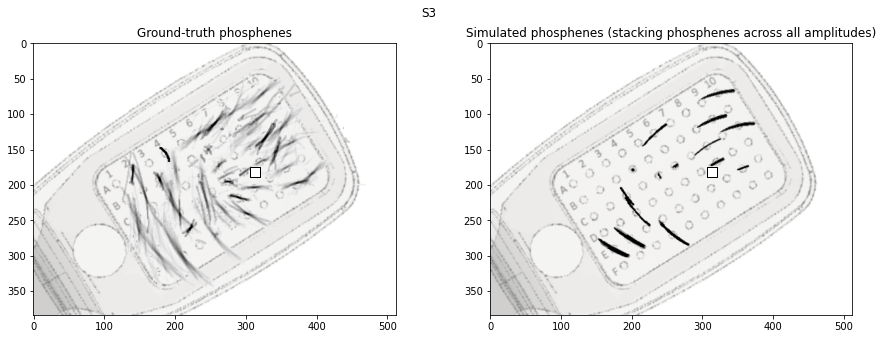

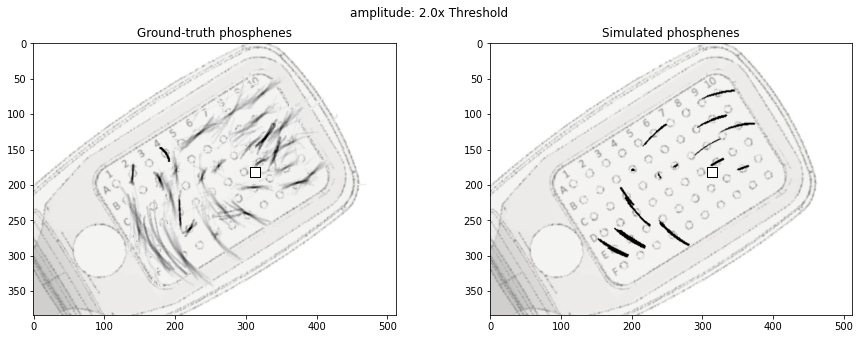

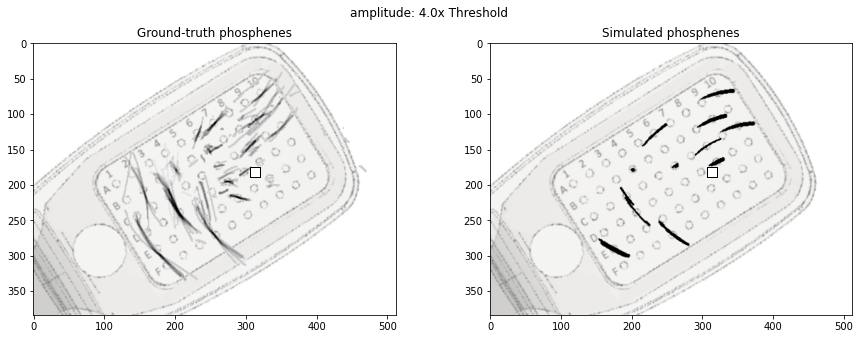

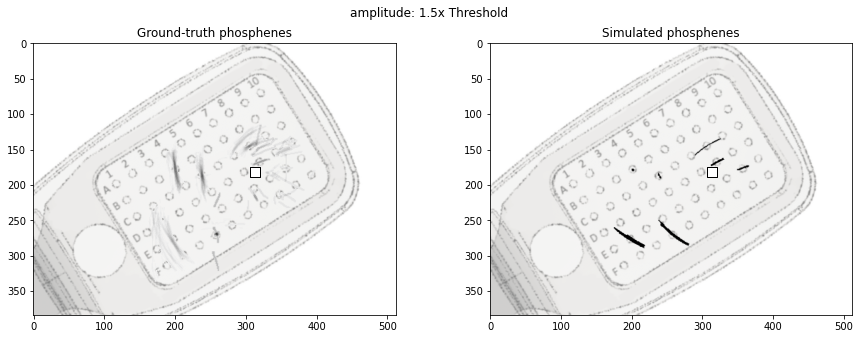

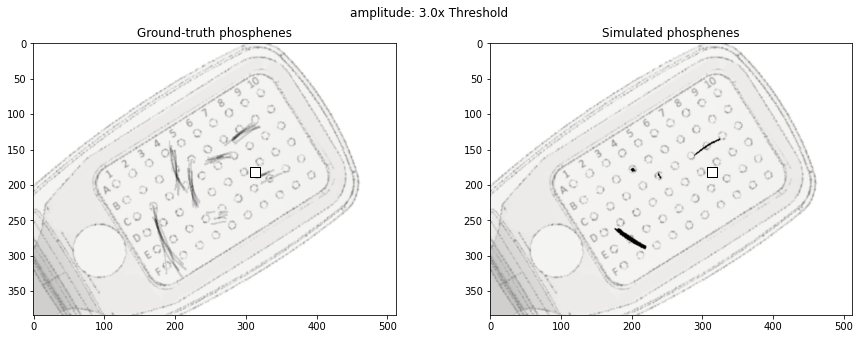

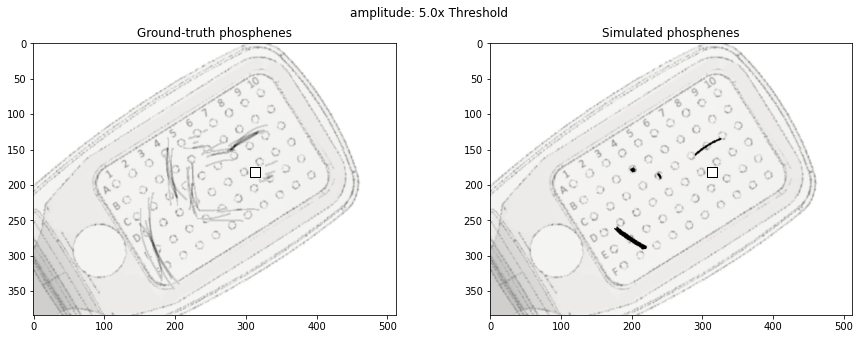

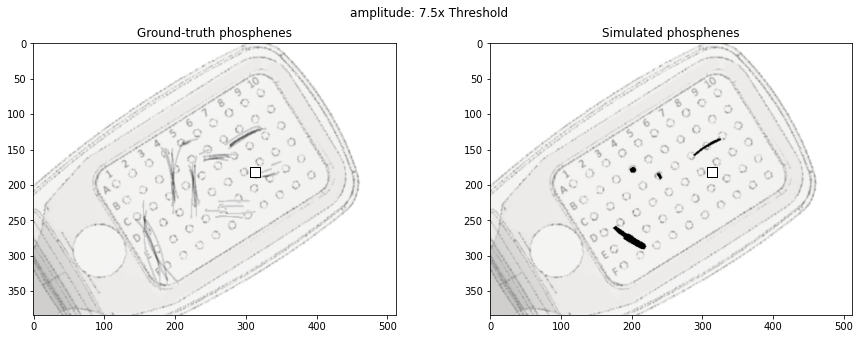

In [26]:
# construct dataframes
data1 = fetch_beyeler2019(subjects='S3')
df_pred = pd.DataFrame({
    'subject':'S3',
    'image':x.pred,
    'electrode':x.electrode1
})

df_pred['xrange']=data1.xrange
df_pred['yrange']=data1.yrange
df_pred['amp'] = x.amp1
df_pred['freq']=x.freq
for i in range(len(df_pred)):
    df_pred['image'][i] = resize(center_image(x.pred[i] > (x.pred[i].max() - x.pred[i].min()) * 0.1 + x.pred[i].min()), y[i].shape)

df_actual = data[['subject','image','electrode1','amp1','freq']]
df_actual['subject'] = 'S3'
df_actual['xrange']=[(-30.0, 30.0)]*len(df_actual)
df_actual['yrange']=[(-22.5, 22.5)]*len(df_actual)
df_actual=df_actual.rename(columns={"electrode1": "electrode",'amp1':'amp'})

fig, (ax_data, ax_sim) = plt.subplots(ncols=2, figsize=(15, 5))
argus = ArgusII(x=-1203, y = 280, rot=-35, eye='RE')
plot_argus_phosphenes(df_actual, argus, ax=ax_data,scale=1)
plot_argus_phosphenes(df_pred, argus,ax=ax_sim,scale=1)
ax_data.set_title('Ground-truth phosphenes')
ax_sim.set_title('Simulated phosphenes (stacking phosphenes across all amplitudes)')
fig.suptitle('S3')

for i in range(len(x.amp1.unique())):
    amp_temp=x.amp1.unique()[i]
    df_actual_temp=df_actual[df_actual['amp']==amp_temp]
    df_pred_temp=df_pred[df_pred['amp']==amp_temp]
    fig, (ax_data, ax_sim) = plt.subplots(ncols=2, figsize=(15, 5))
    plot_argus_phosphenes(df_actual_temp, argus, ax=ax_data,scale=1)
    plot_argus_phosphenes(df_pred_temp, argus,ax=ax_sim,scale=1)
    ax_data.set_title('Ground-truth phosphenes')
    ax_sim.set_title('Simulated phosphenes')
    fig.suptitle('amplitude: ' + str(amp_temp) + 'x Threshold')

In [27]:
df = pd.read_csv('/home/yuchen/shapes/estimator05xystep/biphasic.csv')
df = df[(df['subject'] == 's4') & ~df['test_orientation'].isna()]
df = df.sort_values(df.columns[0]).reset_index(drop=True)
df

,electrode,rho,axlambda,a5,train_combined,train_area,train_MSE_major_axis_length,train_MSE_minor_axis_length,test_combined,test_M00,...,test_M22,test_area,test_eccentricity,test_major_axis_length,test_minor_axis_length,test_orientation,train_size,test_size,filename,subject
0,A1,277.394255,896.166509,0.645419,2.733656,0.493631,1.326614,0.913411,2.884842e+05,6.303035,...,86.419247,6.303035,4.463048e+02,1.636324e+05,36.634308,121403.265588,97,2,Biphasic_s4_A1.pickle,s4
1,A10,233.013516,1252.048170,0.645419,2.764403,0.534701,1.311467,0.918235,1.523241e+08,25.856817,...,10646.693570,23.852925,1.522139e+08,4.383252e+01,76839.347331,26.219884,97,2,Biphasic_s4_A10.pickle,s4
2,A5,262.160153,1031.360001,0.645419,2.646362,0.529541,1.229245,0.887576,1.714484e+01,0.489641,...,1.199012,0.489641,7.911440e-01,1.784026e+00,1.267378,4.678934,87,12,Biphasic_s4_A5.pickle,s4
3,A7,266.692241,1008.538637,0.645419,2.725028,0.490967,1.347869,0.886193,2.360555e+01,0.494856,...,2.014898,0.494856,1.293690e+00,1.999549e+00,3.649953,1.986059,97,2,Biphasic_s4_A7.pickle,s4
4,A8,274.313694,1001.139064,0.645419,2.708214,0.468119,1.350726,0.889369,3.859531e+01,11.007231,...,1.527067,10.792413,7.352017e-01,1.412802e+00,1.207455,4.097182,96,3,Biphasic_s4_A8.pickle,s4
5,B7,257.261628,1253.276100,0.645419,2.729875,0.490831,1.338035,0.901009,4.509794e+01,3.951503,...,1.501156,3.907171,1.296923e+01,1.832161e+00,1.192586,11.930211,96,3,Biphasic_s4_B7.pickle,s4
6,B9,279.885093,1156.612533,0.645419,2.753356,0.475747,1.373228,0.904382,1.652641e+01,0.266929,...,1.499929,0.266929,1.438957e+00,1.461085e+00,2.105064,1.444629,96,3,Biphasic_s4_B9.pickle,s4
7,C10,260.736148,1150.075730,0.645419,2.741003,0.501098,1.329566,0.910339,2.853078e+01,4.674323,...,1.413411,4.674323,9.391833e-01,1.173532e+00,1.051904,4.198942,96,3,Biphasic_s4_C10.pickle,s4
8,D7,231.859540,1329.275961,0.645419,2.817161,0.490223,1.406519,0.920419,3.442279e+03,229.007672,...,844.262903,229.007672,2.692016e+01,2.086586e+01,43.717485,70.093209,96,3,Biphasic_s4_D7.pickle,s4
9,D8,296.261801,743.345389,0.645419,2.806289,0.454236,1.432720,0.919333,3.243391e+02,63.215027,...,1.171044,60.175728,5.283084e+00,5.164384e+00,4.838586,166.774043,96,3,Biphasic_s4_D8.pickle,s4


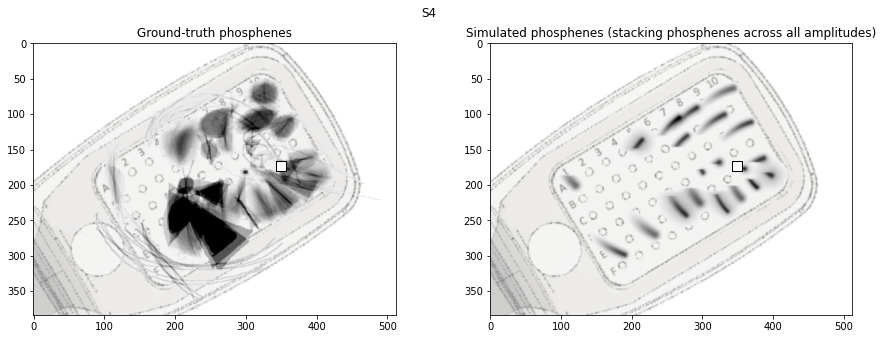

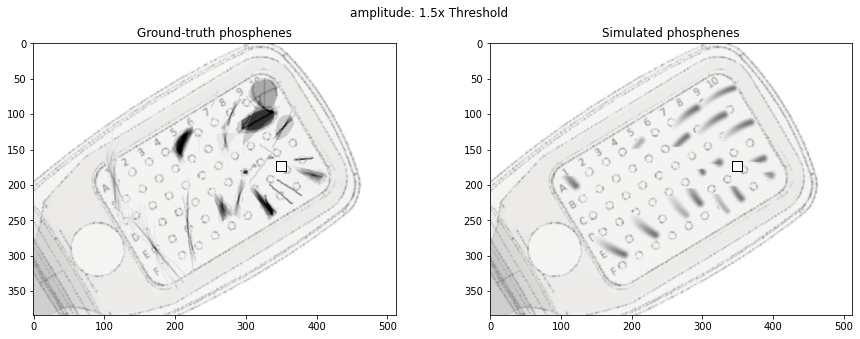

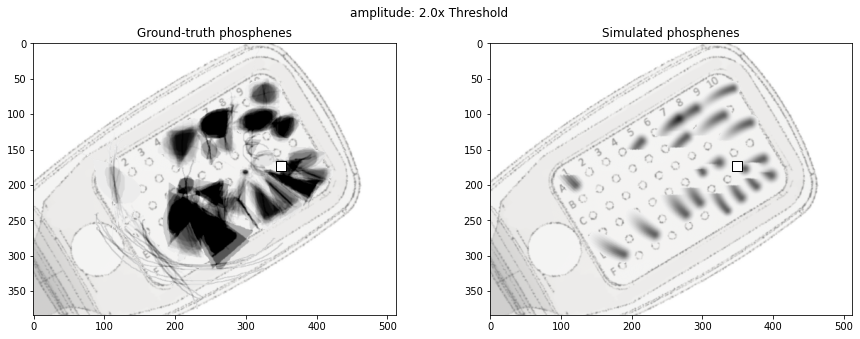

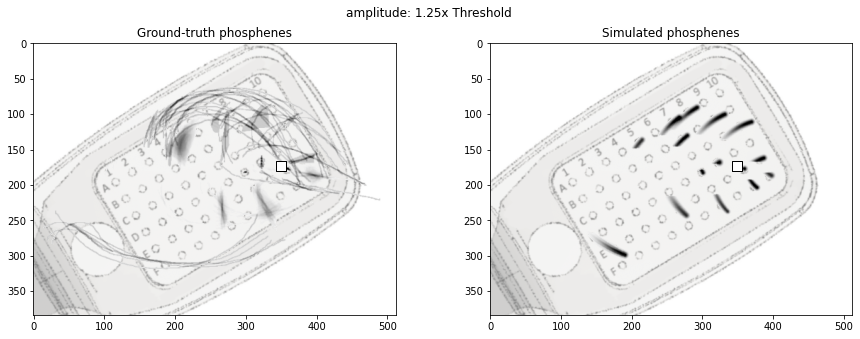

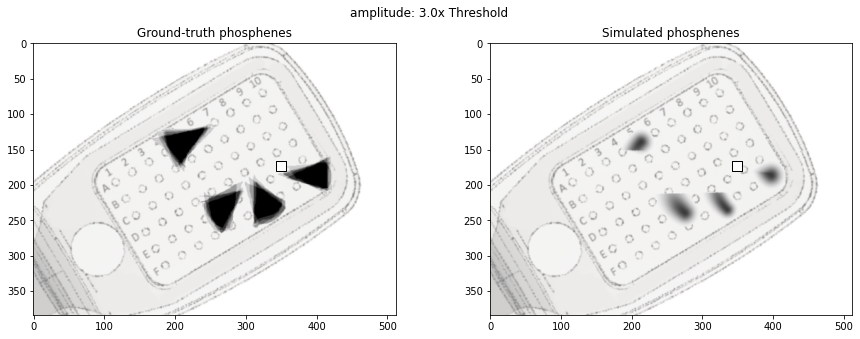

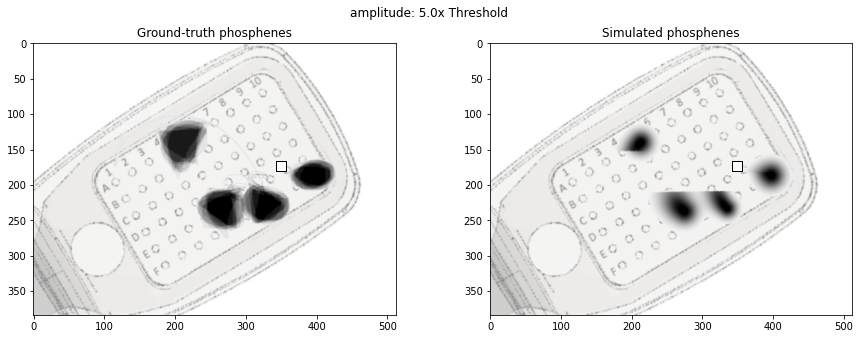

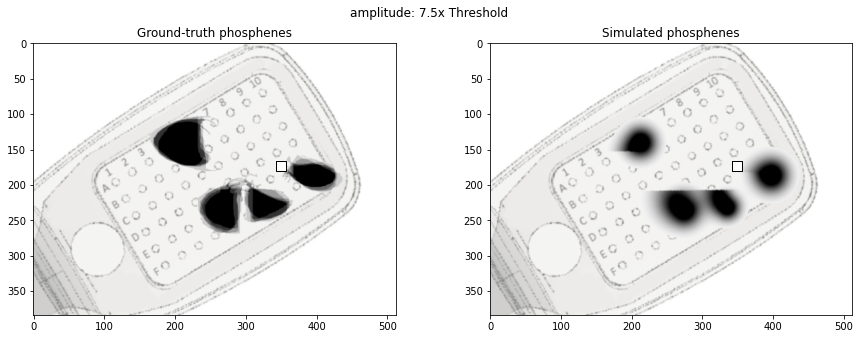

In [30]:
s4 = shapes.subject_params['52-001']
implant, model = shapes.model_from_params(s4)
model.xystep=0.125

estimator = shapes.BiphasicAxonMapEstimator(implant=implant, model=model,resize=True,scale_features=False, threshold='compute', loss_fn='r2',mse_params=['area',"major_axis_length", "minor_axis_length"])
search_params = {
    'rho': (10, 1000),
    'axlambda': (10, 2500)
}
opt = ParticleSwarmOptimizer(estimator, search_params, max_iter=100, swarm_size=20, has_loss_function=True)

data = shapes.load_shapes("/home/yuchen/shapes/data/shapes.h5", subjects=['52-001'], stim_class=None)
data = data[data['electrode2'] == str()].reset_index(drop=True)
x = data[['amp1', 'freq', 'pdur', 'electrode1']]
y = data['image']

y_moments = estimator.compute_moments(y)
averaged_moments = data
averaged_moments[['area', 'eccentricity','compactness']] = y_moments
averaged_moments = averaged_moments.groupby(['electrode1','amp1', 'freq','pdur'])['area', 'eccentricity','compactness'].mean()
x = averaged_moments.index.to_frame().reset_index(drop=True)

x = x[x.electrode1.isin(df.electrode)].reset_index(drop=True)

df_pred = pd.DataFrame()
for i in range(len(df)):
    electrode =  df.electrode[i]
    x_temp = x[x['electrode1']==electrode].reset_index(drop=True)
    df_temp = df[df['electrode']==electrode].reset_index(drop=True)
    
    # set estimator parameters and predict percepts for each leave-one-electrode-out cross validation group
    params = {'rho':df_temp.rho[0], 'axlambda':df_temp.axlambda[0]}
    estimator.set_params(**params)
    estimator.fit(x_temp,averaged_moments.loc[[(electrode)]])
    preds = estimator.predict(x_temp)
    df_pred = pd.concat([df_pred, preds], axis = 0)
x['pred']=df_pred.iloc[:, 0].tolist()

# construct dataframes
from pulse2percept.datasets import fetch_beyeler2019
data1 = fetch_beyeler2019(subjects='S4')
df_pred = pd.DataFrame({
    'subject':'S4',
    'image':x.pred,
    'electrode':x.electrode1
})
df_pred['xrange']=data1.xrange
df_pred['yrange']=data1.yrange
df_pred['amp'] = x.amp1
df_pred['freq']=x.freq
# for i in range(len(df_pred)):
#     df_pred['image'][i] = resize(center_image(preds[i] > (preds[i].max() - preds[i].min()) * 0.1 + preds[i].min()), y[i].shape)
    
df_actual = data[['subject','image','electrode1','amp1','freq']]
df_actual['subject'] = 'S4'
df_actual['xrange']=[(-30.0, 30.0)]*len(df_actual)
df_actual['yrange']=[(-22.5, 22.5)]*len(df_actual)
df_actual=df_actual.rename(columns={"electrode1": "electrode",'amp1':'amp'})

# plot
fig, (ax_data, ax_sim) = plt.subplots(ncols=2, figsize=(15, 5))
argus = ArgusII(x=-1945, y = 469, rot=-34, eye='RE')
plot_argus_phosphenes(df_actual, argus, ax=ax_data,scale=0.7)
plot_argus_phosphenes(df_pred, argus,ax=ax_sim,scale=0.7)
ax_data.set_title('Ground-truth phosphenes')
ax_sim.set_title('Simulated phosphenes (stacking phosphenes across all amplitudes)')
fig.suptitle('S4')

for i in range(len(x.amp1.unique())):
    amp_temp=x.amp1.unique()[i]
    df_actual_temp=df_actual[df_actual['amp']==amp_temp]
    df_pred_temp=df_pred[df_pred['amp']==amp_temp]
    fig, (ax_data, ax_sim) = plt.subplots(ncols=2, figsize=(15, 5))
    plot_argus_phosphenes(df_actual_temp, argus, ax=ax_data,scale=0.7)
    plot_argus_phosphenes(df_pred_temp, argus,ax=ax_sim,scale=0.7)
    ax_data.set_title('Ground-truth phosphenes')
    ax_sim.set_title('Simulated phosphenes')
    fig.suptitle('amplitude: ' + str(amp_temp) + 'x Threshold')

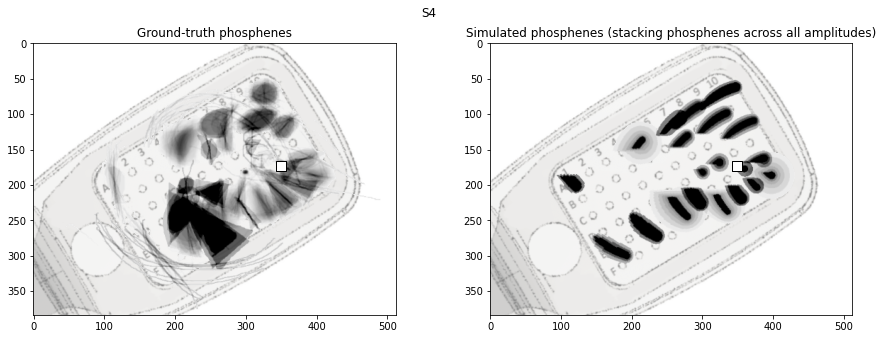

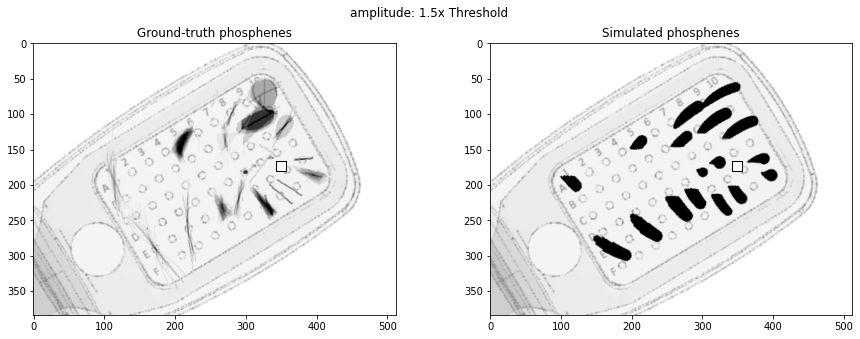

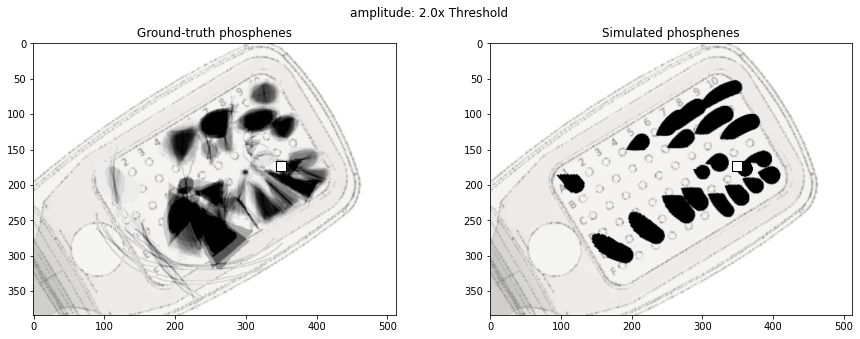

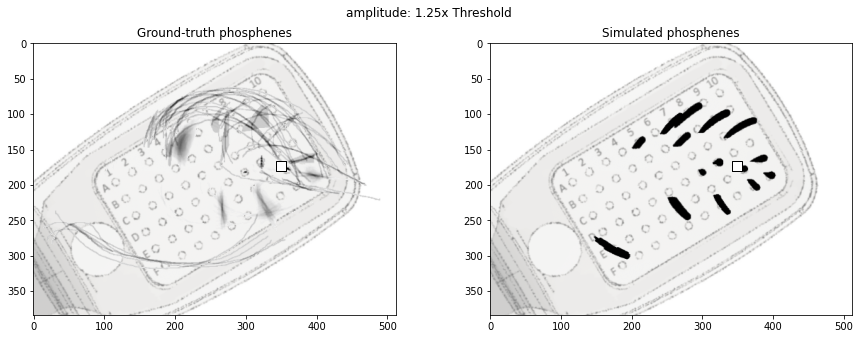

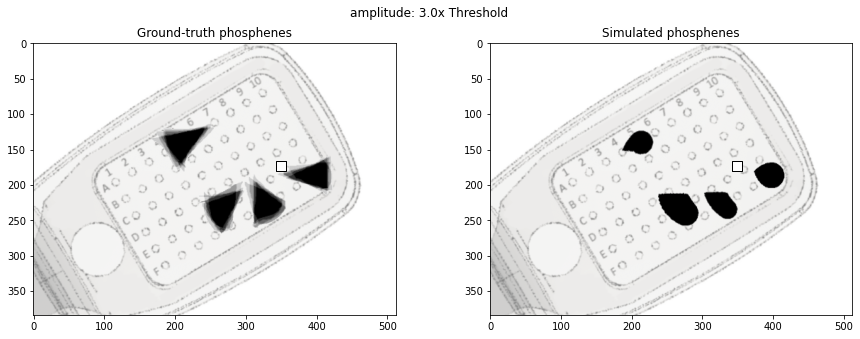

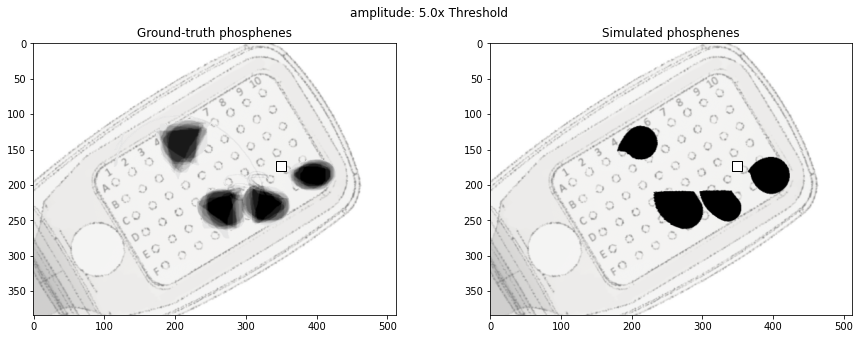

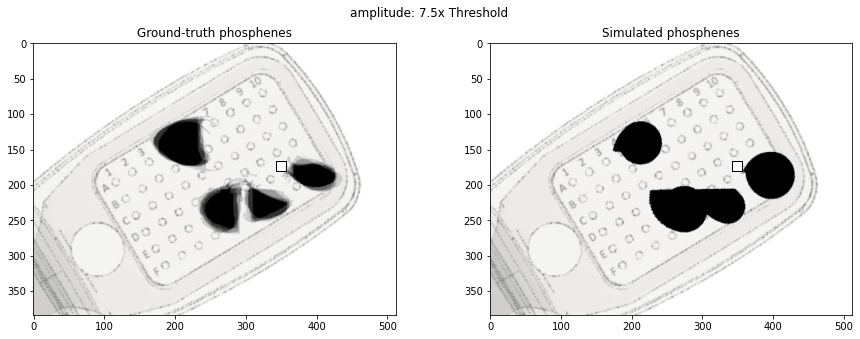

In [31]:
# construct dataframes
data1 = fetch_beyeler2019(subjects='S4')
df_pred = pd.DataFrame({
    'subject':'S4',
    'image':x.pred,
    'electrode':x.electrode1
})
df_pred['xrange']=data1.xrange
df_pred['yrange']=data1.yrange
df_pred['amp'] = x.amp1
df_pred['freq']=x.freq
for i in range(len(df_pred)):
    df_pred['image'][i] = resize(center_image(x.pred[i] > (x.pred[i].max() - x.pred[i].min()) * 0.1 + x.pred[i].min()), y[i].shape)
    
df_actual = data[['subject','image','electrode1','amp1','freq']]
df_actual['subject'] = 'S4'
df_actual['xrange']=[(-30.0, 30.0)]*len(df_actual)
df_actual['yrange']=[(-22.5, 22.5)]*len(df_actual)
df_actual=df_actual.rename(columns={"electrode1": "electrode",'amp1':'amp'})

# plot
fig, (ax_data, ax_sim) = plt.subplots(ncols=2, figsize=(15, 5))
argus = ArgusII(x=-1945, y = 469, rot=-34, eye='RE')
plot_argus_phosphenes(df_actual, argus, ax=ax_data,scale=0.7)
plot_argus_phosphenes(df_pred, argus,ax=ax_sim,scale=0.7)
ax_data.set_title('Ground-truth phosphenes')
ax_sim.set_title('Simulated phosphenes (stacking phosphenes across all amplitudes)')
fig.suptitle('S4')

for i in range(len(x.amp1.unique())):
    amp_temp=x.amp1.unique()[i]
    df_actual_temp=df_actual[df_actual['amp']==amp_temp]
    df_pred_temp=df_pred[df_pred['amp']==amp_temp]
    fig, (ax_data, ax_sim) = plt.subplots(ncols=2, figsize=(15, 5))
    plot_argus_phosphenes(df_actual_temp, argus, ax=ax_data,scale=0.7)
    plot_argus_phosphenes(df_pred_temp, argus,ax=ax_sim,scale=0.7)
    ax_data.set_title('Ground-truth phosphenes')
    ax_sim.set_title('Simulated phosphenes')
    fig.suptitle('amplitude: ' + str(amp_temp) + 'x Threshold')